# import modules

In [92]:
import os
import sys
import re
import pickle
import random
import subprocess
import time
import threading
import shutil
from concurrent.futures import ThreadPoolExecutor, ProcessPoolExecutor, wait, ALL_COMPLETED
from datetime import datetime, timedelta
from multiprocessing import Process, Pool

import numpy as np
import pandas as pd
import anndata as ad
# import h5py
import Bio
from Bio import motifs
import pysam
import pyranges
import pybedtools
import matplotlib.pyplot as plt
import matplotlib as mpl
import seaborn as sns
import sklearn
from sklearn.preprocessing import quantile_transform
import scipy as sp
import scanpy as sc
from adjustText import adjust_text
# import episcanpy

# from giggle import Giggle

In [5]:
sc.settings.verbosity = 3
# sc.logging.print_header()
sc.logging.print_versions()

-----
anndata     0.7.5
scanpy      1.6.0
sinfo       0.3.1
-----
Bio                 1.78
PIL                 8.0.1
anndata             0.7.5
backcall            0.2.0
bamnostic           NA
cairo               1.19.1
cffi                1.14.0
cycler              0.10.0
cython_runtime      NA
dateutil            2.8.1
decorator           4.4.2
episcanpy           0.3.0
get_version         2.1
h5py                2.10.0
igraph              0.8.3
ipykernel           5.3.4
ipython_genutils    0.2.0
jedi                0.17.2
joblib              0.17.0
kiwisolver          1.3.0
legacy_api_wrap     1.2
llvmlite            0.34.0
louvain             0.6.1
matplotlib          3.3.2
mpl_toolkits        NA
natsort             7.1.0
ncls                0.0.57
numba               0.51.2
numexpr             2.7.1
numpy               1.19.1
packaging           20.4
pandas              1.1.3
parso               0.7.0
pexpect             4.8.0
pickleshare         0.7.5
pkg_resources       NA
prompt

In [2]:

def print_full(x):
    pd.set_option('display.max_rows', None)
    pd.set_option('display.max_columns', None)
    pd.set_option('display.width', 2000)
    pd.set_option('display.float_format', '{:20,.2f}'.format)
    pd.set_option('display.max_colwidth', None)
    print(x)
    pd.reset_option('display.max_rows')
    pd.reset_option('display.max_columns')
    pd.reset_option('display.width')
    pd.reset_option('display.float_format')
    pd.reset_option('display.max_colwidth')

In [423]:
pd.reset_option('display.max_rows')
pd.reset_option('display.max_columns')
pd.reset_option('display.width')
pd.reset_option('display.float_format')
pd.reset_option('display.max_colwidth')

# generate index

## human

In [7]:
QC = pd.read_csv("/mnt/Storage/home/dongxin/temp/cistrome/human_factor_full_QC.txt", sep = "\t")
factor_list = QC.Factor.unique().tolist()
for f in factor_list:
    if len(QC[(QC["Factor"] == f)]) > 2:
        need_remove_table_factor = QC[(QC["Factor"] == f)]
        cell_line_list = need_remove_table_factor.Cell_line.unique().tolist()
        for cl in cell_line_list:
            if len(need_remove_table_factor[need_remove_table_factor["Cell_line"] == cl]) > 2:
                need_remove_table_cl = need_remove_table_factor[need_remove_table_factor["Cell_line"] == cl]
                remove_id = list(set(need_remove_table_cl.index.tolist()) - set(need_remove_table_cl.sort_values(by="PeaksFoldChangeAbove10", ascending=False).head(2).index.tolist()))
                QC = QC.drop(index=remove_id)
            else:
                continue
    else:
        continue


# rename index bed file
for i in os.listdir("/mnt/Storage/home/dongxin/temp/cistrome/filter_bed/fiveFoldPeak/"):
    dcid = int(i.split(".")[0])
    factor = QC[QC["DCid"] == dcid]["Factor"].to_string().split()[1]
    if "/" in factor or "_" in factor:
        factor = factor.replace("/", "or").replace("_", "")
#     Cell_line = QC[QC["DCid"] == dcid]["Cell_line"].to_string().split()[1]
#     Cell_type = 
#     Tissue_type
    os.system("mv /mnt/Storage/home/dongxin/temp/cistrome/filter_bed/fiveFoldPeak/%s.bed.gz /mnt/Storage/home/dongxin/temp/cistrome/filter_bed/fiveFoldPeak/%s_%s.bed.gz" % (dcid,dcid,factor))

FileNotFoundError: [Errno 2] No such file or directory: '/mnt/Storage/home/dongxin/temp/cistrome/human_factor_full_QC.txt'

#### generate bed annotation

In [172]:
annotation_path = '/mnt/Storage2/home/dongxin/Projects/scATAC/reference/giggle.all/CistromeDB.sample.annotation.txt'
anno_table = pd.read_csv(annotation_path,sep="\t")
factorid = list(map(str,anno_table[(anno_table["FactorType"]=='tf')]["ID"].tolist()))
factor_dict = anno_table[(anno_table["FactorType"]=='tf')][["ID","Factor"]].set_index("ID").to_dict()["Factor"]
# map factor by id "_"
factor_index_list = []
for i in result_p.index:
    factor_name = i.split("_")
    if len(factor_name) != 2:
        try:
            factor_index_list.append(factor_dict[int(factor_name[0])])
        except:
            print(factor_name)
            factor_index_list.append("None")
    else:
        factor_index_list.append(factor_name[1])

## Mouse

In [5]:
QC = pd.read_csv("/mnt/Storage/home/dongxin/Files/cistrome/mouse/mouse_factor_full_QC.txt", sep = "\t")
factor_list = QC.Factor.unique().tolist()
for f in factor_list:
    if len(QC[(QC["Factor"] == f)]) > 2:
        need_remove_table_factor = QC[(QC["Factor"] == f)]
        cell_line_list = need_remove_table_factor.Cell_line.unique().tolist()
        for cl in cell_line_list:
            if len(need_remove_table_factor[need_remove_table_factor["Cell_line"] == cl]) > 2:
                need_remove_table_cl = need_remove_table_factor[need_remove_table_factor["Cell_line"] == cl]
                remove_id = list(set(need_remove_table_cl.index.tolist()) - set(need_remove_table_cl.sort_values(by="PeaksFoldChangeAbove10", ascending=False).head(2).index.tolist()))
                QC = QC.drop(index=remove_id)
            else:
                continue
    else:
        continue

In [4]:
pd.options.display.max_rows = 100
for ID in QC['DCid']:
    os.system('cp /mnt/Storage/home/dongxin/Files/cistrome/mouse/mouse_factor/%s_sort_peaks.narrowPeak.bed /mnt/Storage/home/dongxin/Files/cistrome/mouse/filter_bed/%s.bed' % (ID,ID))

In [8]:
# rename index bed file
for i in os.listdir("/mnt/Storage/home/dongxin/Files/cistrome/mouse/filter_bed/300_10K_bed/"):
    dcid = int(i.split(".")[0])
    factor = QC[QC["DCid"] == dcid]["Factor"].to_string().split()[1]
    if "/" in factor or "_" in factor:
        factor = factor.replace("/", "or").replace("_", "")
    os.system("mv /mnt/Storage/home/dongxin/Files/cistrome/mouse/filter_bed/300_10K_bed/%s.bed /mnt/Storage/home/dongxin/Projects/scATAC/mouse/top10k/%s_%s.bed" % (dcid,dcid,factor))

# define functions

In [3]:
def add_time(func):
    def wrapper(*args, **kw):
        sys.stdout.write('INFO {time} '.format(time=time.strftime("%Y-%m-%d %H:%M:%S")))
        return func(*args, **kw)
    return wrapper

@add_time
def print_log(string, end="\n"):
    print(string, end=end)

def excute_info(start_info=None, end_info=None):
    def call(func):
        def wrapper(*args, **kwargs):
            if start_info:
                print_log(start_info)
            ret = func(*args, **kwargs)
            if end_info:
                print_log(end_info)
            return ret
        return wrapper
    return call



## generate bed function

In [4]:
def read_SingleCellExperiment_rds(input_RDS):
    import anndata2ri
    from rpy2.robjects import r
    anndata2ri.activate()
    rscript = 'readRDS("{RDS_file_path}")'.format(RDS_file_path = input_RDS)
    adata = r(rscript)
    return adata

In [5]:
def generate_beds(file_path, cells, input_mat, peak_confidence):
    cell_above_cutoff_index = sc.pp.filter_genes(input_mat[cells,:], min_cells=peak_confidence, inplace=False)[0]
    peaks = input_mat.var_names[cell_above_cutoff_index].to_list()
    peaks = pd.DataFrame([p.split("_") for p in peaks])
    peaks.to_csv(file_path, sep="\t", header= None, index=None)
    cmd = 'sort --buffer-size 2G -k1,1 -k2,2n -k3,3n {bed_path} | bgzip -c > {bed_path}.gz\n'.format(bed_path=file_path)
    cmd += 'rm {bed_path}'.format(bed_path=file_path)
    subprocess.run(cmd, shell=True, check=True)

@excute_info('Start generating background beds ...', 'Finished generating background beds!')
def generate_background_bed(input_mat, bg_bed_path, map_dict_store_path, step=50, iteration=1000, peak_confidence=5, n_cores=8):
    map_dict = {}
    if not os.path.exists(bg_bed_path):
        os.makedirs(bg_bed_path)
    cl_name = input_mat.obs_names.to_list()
    total_cnt = iteration
    executor = ThreadPoolExecutor(max_workers=n_cores)
    all_task = []
    for i in range(0,iteration): 
        random.seed(i)
        map_dict[i] = random.sample(cl_name, step)
        all_task.append(executor.submit(generate_beds, bg_bed_path + "/" + str(i) + ".bed", map_dict[i], input_mat, peak_confidence))
    wait(all_task, return_when=ALL_COMPLETED)
    with open(map_dict_store_path, "wb") as map_dict_file:
        pickle.dump(map_dict, map_dict_file)
    return map_dict

@excute_info('Start generating group beds ...', 'Finished generating group beds!')
def generate_cluster_bed(adata, input_mat, bed_path, map_dict_store_path, step=50, cell_cutoff=20, peak_confidence=5):
    metadata = adata.obs
    map_dict = {}
    if not os.path.exists(bed_path):
        os.makedirs(bed_path)
    cluster_info = metadata["seurat_clusters"].unique().to_list()
    for i in cluster_info:
        cluster_cell_name = metadata[metadata['seurat_clusters'] == i].index.to_list()
        start = range(0, len(cluster_cell_name), step)
        j = 0
        for s in start:
            cl_name = cluster_cell_name[s:(s + step)]
            key = str(i) + "_" + str(j)
            map_dict[key] = cl_name
            if len(cl_name) <= cell_cutoff:
                print_log(key + " only have " + str(len(cl_name)), " cells, skip generate bed file.\n")
                continue
            else:
                generate_beds(bed_path + "/" + str(key) + ".bed", map_dict[key], input_mat, peak_confidence)
                j = j+1
    with open(map_dict_store_path, "wb") as map_dict_file:
        pickle.dump(map_dict, map_dict_file)
    return map_dict

def sub_coor_table_in_small_square(cell, coor_table, step, t):
    tmp = coor_table[(coor_table['X'] < coor_table.loc[cell, 'X'] + step * t) & 
                     (coor_table['X'] > coor_table.loc[cell, 'X'] - step * t) &  
                     (coor_table['Y'] < coor_table.loc[cell, 'Y'] + step * t) & 
                     (coor_table['Y'] > coor_table.loc[cell, 'Y'] - step * t)]
    return tmp.copy()

def find_nearest_cells(cell, coor_table, n_neighbor=20, step=None):
#   coor_table has two columns: X, Y, the index of coortable is cell barcodes
    if step == None:
        up_limit = coor_table.max()
        down_limit = coor_table.min()
        width = up_limit.X - down_limit.X
        height = up_limit.Y - down_limit.Y
        step = min(width, height)/200
    t = 1
    tmp = pd.DataFrame()
    while tmp.shape[0] < n_neighbor:
        tmp = sub_coor_table_in_small_square(cell, coor_table, step, t)
        t += 1
    squ_distance = [(tmp.loc[i,"X"] - tmp.loc[cell,"X"])**2 + (tmp.loc[i,"Y"] - tmp.loc[cell,"Y"])**2 for i in tmp.index]
    tmp['distance'] = squ_distance
    tmp = tmp.sort_values(by='distance', ascending=True)
    # since we use square to check the distance, check whether the point is out the circle
    while tmp.iloc[n_neighbor-1, 2] > ((step*t)**2):
        t += 1
        tmp = sub_coor_table_in_small_square(cell, coor_table, step, t)
        squ_distance = [(tmp.loc[i,"X"] - tmp.loc[cell,"X"])**2 + (tmp.loc[i,"Y"] - tmp.loc[cell,"Y"])**2 for i in tmp.index]
        tmp['distance'] = squ_distance
        tmp = tmp.sort_values(by='distance', ascending=True) 
    neighbor_bcs = tmp.index[0:n_neighbor].tolist()
    return neighbor_bcs

@excute_info('Start generating nearest neighbor cells beds ...', 'Finished generating nearest neighbor cells beds!')
def generate_neighbor_bed(adata, input_mat, bed_path, map_dict_store_path, n_neighbor=10, peak_confidence=2, n_cores=8):
    coor_table = pd.DataFrame(adata.obsm['X_umap'], index = adata.obs.index, columns=["X","Y"])
    width = coor_table.max().X - coor_table.min().X
    height = coor_table.max().Y - coor_table.min().Y
    step = min(width, height)/200
    map_dict = {}
    if not os.path.exists(bed_path):
        os.makedirs(bed_path)
    total_cnt = adata.obs.index.__len__()
    executor = ThreadPoolExecutor(max_workers=n_cores)
    all_task = []
#     for clstr in adata.obs['seurat_clusters'].unique().to_list()
#         clstr_cell_list = adata.obs.index[adata.obs['seurat_clusters'] == clstr].to_list()
#         coor_table = coor_table_all.loc[clstr_cell_list,]
    for cell in adata.obs.index:
        neighbor_cells = find_nearest_cells(cell, coor_table, n_neighbor, step)
        map_dict[cell] = neighbor_cells
        all_task.append(executor.submit(generate_beds, bed_path + "/" + str(cell) + ".bed", neighbor_cells, input_mat, peak_confidence))
    wait(all_task, return_when=ALL_COMPLETED)
    with open(map_dict_store_path, "wb") as map_dict_file:
        pickle.dump(map_dict, map_dict_file)
    return map_dict


## search giggle function

In [6]:
def search_giggle(bed_path, result_path, index_path):
#     bed = bed_path.split("/")[-1]
#     if bed_path.endswith('gz'):
    cmd = 'giggle search -i "{index_path}" -s -q "{bed_path}" > "{result_path}"\n'.format(index_path=index_path, result_path=result_path, bed_path=bed_path)
#     print(cmd)
#     else:
#         cmd = 'sort --buffer-size 2G -k1,1 -k2,2n -k3,3n {bed_path} | bgzip -c > {bed_path}.gz\n'.format(bed_path=bed_path)
#         cmd += 'giggle search -i {index_path} -s -q {bed_path}.gz > {result_path}\n'.format(index_path=index_path, result_path=result_path, bed_path=bed_path)
#         cmd += 'rm {bed_path}'.format(bed_path=bed_path)
    subprocess.run(cmd, shell=True, check=True)

def search_giggle_batch(bed_folder, result_folder, index_path, n_cores=8):
    if not os.path.exists(result_folder):
        os.makedirs(result_folder)
    beds = os.listdir(bed_folder)
    args = []
    for bed in beds:
        barcodes = bed[:-7] # remove suffix '.bed.gz'
        args.append((bed_folder + '/' + bed, result_folder + '/' + barcodes + '.txt', index_path))
    with Pool(n_cores) as p:
        p.starmap(search_giggle, args)

# def read_giggle_result(path):
#     """For giggle stored path, return a table, col is cell cluster / cell and row is factor"""
#     file_list = os.listdir(path)
#     print_log('Reading search result in {path}, in total {number} files.'.format(path=path, number=len(file_list)))
#     for i in range(len(file_list)):
#         if i%50 == 0:
#             print_log("finished {percentage:.2f} %".format(percentage = i*100/file_list.__len__()), end="\r")
#         giggle_result = file_list[i]
#         cell_bc = giggle_result[:-4] # remove suffix '.txt'
#         dtframe = pd.read_csv(os.path.join(path, giggle_result), sep="\t", index_col=False)
#         if i == 0:
#             dtframe = dtframe.loc[:,["#file", "combo_score"]]
#             total = dtframe.rename(columns={'combo_score':cell_bc}).copy()
#         else:
#             newcol = dtframe[["combo_score"]]
#             total[cell_bc] = newcol
#     idList = [i.replace(".bed.gz","") for i in total['#file']]
#     total = total.rename(columns={"#file":"id"})
#     total["id"] = idList
#     total = total.set_index("id")
#     return total

def read_giggle_result(files, i):
#     giggle_result = os.path.basename(files[0])
#     cell_bc = giggle_result[:-4] # remove suffix '.txt'
#     dtframe = pd.read_csv(files[0], sep="\t", index_col=False)
#     dtframe = dtframe.loc[:,["#file", "combo_score"]]
#     total = dtframe.rename(columns={'combo_score':cell_bc}).copy()
    for i in range(len(files)):
        giggle_result = os.path.basename(files[i])
        cell_bc = giggle_result[:-4] # remove suffix '.txt'
        dtframe = pd.read_csv(files[i], sep="\t", index_col=False)
        if i == 0:
            dtframe = dtframe.loc[:,["#file", "combo_score"]]
            total = dtframe.rename(columns={'combo_score':cell_bc}).copy()
        else:
            newcol = dtframe[["combo_score"]]
            total[cell_bc] = newcol
    idList = [i[:-7] for i in total['#file']] # remove suffix '.bed.gz'
    total = total.rename(columns={"#file":"id"})
    total["id"] = idList
    total = total.set_index("id")
    return total

def read_giggle_result_batch(path, n_cores=8):
    print_log("Reading searching results, using {n} cores...".format(n=n_cores))
    file_list = os.listdir(path)
    result_split = np.array_split(file_list, n_cores)
    args = [[[os.path.join(path, j) for j in list_chunk], i] for (i, list_chunk) in enumerate(result_split)]
    with Pool(n_cores) as p:
        result = p.starmap(read_giggle_result, args)
    total = pd.concat([i for i in result], axis=1)
    return total


## pvalue calculation function

In [7]:
def cal_hist_auc(arrays, bins = 500):
    """Calculate the AUC of the arrays distribution
    """
    y_score = np.array(arrays)
    hist = arrays.value_counts(bins=bins)
    hist = hist.sort_index()
    append_right = hist.index[bins-1].right
    hist.index = hist.index.left
    # bins is the regions, like [1100, 1200, 1300 ...]
    bins = np.asarray(hist.index)
    # bins[0] = bins[1] - np.diff(bins)[1]
    bins = np.append(bins, append_right)
    # values is the height of each bins, like [0, 0, 1, 2, 0, 1 ...]
    values = np.asarray(hist.values)
    area = sum(np.diff(bins)*values)
    return area, bins, values

def find_bin_idx_of_value(bins, value):
    """Finds the bin which the value corresponds to."""
    array = np.asarray(value)
    idx = np.digitize(array, bins)
    if idx == 0:
        return 0
    return idx-1

def area_after_val(values, bins, val):
    """Calculates the area of the hist after a certain value"""
    left_bin_edge_index = find_bin_idx_of_value(bins, val)
#     bin_width = np.diff(bins)[1]
#     print(bin_width)
    area = sum(np.diff(bins)[left_bin_edge_index:] * values[left_bin_edge_index:])
    return area

def cal_p(fg_value, bg_area, bg_bins, bg_values):
    pvalue = area_after_val(bg_values, bg_bins, fg_value)/bg_area
    if pvalue > 1:
        pvalue = 1.0
    return pvalue

def cal_fc(fg_value, bg_mean):
    if bg_mean * fg_value > 0: # if mean and value are opposite
        fc = fg_value / bg_mean
    elif bg_mean == 0:
        fc = fg_value
    else:
        fc = bg_mean / (bg_mean - fg_value)
    return fc

# calculate p value by area at the right of curve
# calculate fc by value / background average
def cal_p_table(fg_table, bg_table, i):
    print_log('chunk {i} calculating ...'.format(i=i))
    result_table_p = fg_table.copy()
#     result_table_fc = fg_table.copy()
    for factor in fg_table.index:
        factor_bg = bg_table.loc[factor,:]
        bg_mean = np.mean(factor_bg)
        bg_std = np.std(factor_bg)
        if bg_mean != 0 and bg_std != 0:
            result_table_p.loc[factor,:] = fg_table.loc[factor,:].apply(sp.stats.norm.cdf, args=(bg_mean, bg_std))
        else:
            result_table_p.loc[factor,:] = 1.0
#         result_table_fc.loc[factor,:] = fg_table.loc[factor,:].apply(cal_fc, **{'bg_mean': bg_mean})
    print_log('chunk {i} finished calculation!'.format(i=i))
    return 1-result_table_p

def cal_p_table_batch(fg_table, bg_table, n_cores=8):
    print_log("Calculating enrichment, divide into {n} chunks...".format(n=n_cores))
    fg_table_split = np.array_split(fg_table, n_cores)
    args = [[table, bg_table, i] for (i, table) in enumerate(fg_table_split)]
    with Pool(n_cores) as p:
        result = p.starmap(cal_p_table, args)
    print_log("Generating P value table ...")
    result_table_p = pd.concat([i for i in result])
#     print("INFO {time}, Generating FC value table ...".format(time=datetime.now()))
#     result_table_fc = pd.concat([i[1] for i in result])
    print_log('Finished calculation enrichment!')
    return result_table_p

def correct_pvalues_for_multiple_testing(pvalues, correction_type = "Benjamini-Hochberg"):                
    """                                                                                                   
    consistent with R - print correct_pvalues_for_multiple_testing([0.0, 0.01, 0.029, 0.03, 0.031, 0.05, 0.069, 0.07, 0.071, 0.09, 0.1]) 
    modified from https://stackoverflow.com/questions/7450957/how-to-implement-rs-p-adjust-in-python/7453313
    """
    pvalues = np.array(pvalues) 
    n = pvalues.shape[0]     
    new_pvalues = np.empty(n)
    if correction_type == "Bonferroni":   
        new_pvalues = n * pvalues
    elif correction_type == "Bonferroni-Holm": 
        values = [(pvalue, i) for i, pvalue in enumerate(pvalues)]                                      
        values.sort()
        for rank, vals in enumerate(values):                                                              
            pvalue, i = vals
            new_pvalues[i] = (n-rank) * pvalue                                                            
    elif correction_type == "Benjamini-Hochberg":                                                         
        values = [(pvalue, i) for i, pvalue in enumerate(pvalues)]                                      
        values.sort()
        values.reverse()
        new_values = []
        for i, vals in enumerate(values): 
            rank = n - i
            pvalue, index = vals 
            new_values.append((n/rank) * pvalue) 
        for i in range(0, int(n)-1): 
            if new_values[i] < new_values[i+1]:                                                           
                new_values[i+1] = new_values[i]                                                           
        for i, vals in enumerate(values):
            pvalue, index = vals
            new_pvalues[index] = new_values[i]                                                                                                                  
    return new_pvalues


## post processing

In [8]:
@excute_info('Summary result from dataset level to factor level.') 
def map_factor_on_ChIP(table):
    # map factor by id "_"
    factor_index_list = []
    for i in table.index:
        factor_name = i.split("_")
        if len(factor_name) != 2:
            try:
                factor_index_list.append(factor_dict[int(factor_name[0])])
            except:
                print(factor_name)
                factor_index_list.append("None")
        else:
            factor_index_list.append(factor_name[1])
    table["Factor"] = factor_index_list
    return table.groupby("Factor").min()

@excute_info('Extract cell by map dictionary ...', 'Finished all clusters!')
def extract_by_cell_cluster(result_table, map_dict):
    r_table = pd.DataFrame()
    for key in result_table.columns:
        key_cell_number = len(map_dict[key])
        table_index = result_table.index
        cell_bc = map_dict[key]
        new_table_np = np.tile(result_table[key].to_numpy(),[key_cell_number,1]).T
        tmp_table = pd.DataFrame(new_table_np, index = table_index, columns=cell_bc)
        r_table = pd.concat([r_table, tmp_table], axis=1)
    return r_table

def p_to_z_transform(p_table):
    z_table = -np.log10(np.sqrt(p_table+1e-8)).T.apply(sp.stats.zscore, axis=0).T.copy()
    return z_table

@excute_info('Generating merged anndata ... ', 'Finished Generating merged anndata!')
def merge_giggle_singlecell_experiment(adata, table, data_type, table2=''):
    # table : each row is a cell, each column is a TF/Gene
    new_adata = adata.copy()
    if data_type == 'integration':
        p_table = table.copy()
        p_table2 = table2.copy()
        new_adata.uns['ChIP_p'] = p_table
        new_adata.uns['motif_p'] = p_table2
        # tmp table, usually chip_table
#         tmp_table = tmp_table.T.apply(correct_pvalues_for_multiple_testing, axis=0)
#         tmp_table = -np.log10(tmp_table + 1e-10).apply(sp.stats.zscore, axis=0)
        new_adata.uns['ChIP_z'] = p_to_z_transform(p_table)
        # tmp table, usually motif table
        p_table2 = p_table2.reindex(index = p_table.index)
#         tmp_table2 = tmp_table2.T.apply(correct_pvalues_for_multiple_testing, axis=0)
#         tmp_table2 = -np.log10(tmp_table2 + 1e-10).apply(sp.stats.zscore, axis=0)
        new_adata.uns['motif_z'] = p_to_z_transform(p_table2)
        # extract factor
        chip_tfs = tmp_table.columns.tolist()
        motif_tfs = tmp_table2.columns.tolist()
        overlap_tf_list = list(set(chip_tfs).intersection(set(motif_tfs)))
        chip_other_tf_list = list(set(chip_tfs) - set(overlap_tf_list))
        motif_other_tf_list = list(set(motif_tfs) - set(overlap_tf_list))
        ovlp_chip_table = tmp_table[overlap_tf_list]
        ovlp_motif_table = tmp_table2[overlap_tf_list]
        unique_chip_table = tmp_table[chip_other_tf_list]
        unique_motif_table = tmp_table2[motif_other_tf_list]
        ovlp_final_table = pd.DataFrame()
        for ovlp_factor in overlap_tf_list:
            if np.std(ovlp_chip_table[ovlp_factor]) >= np.std(ovlp_motif_table[ovlp_factor]):
                ovlp_final_table[ovlp_factor] = ovlp_chip_table[ovlp_factor]
            else:
                ovlp_final_table[ovlp_factor] = ovlp_motif_table[ovlp_factor]
        final_table = pd.concat([ovlp_final_table,unique_chip_table,unique_motif_table], axis=1)
        final_table.columns = ['I_' + tf for tf in final_table.columns.tolist()]
        new_adata.uns['integrated_TF_z'] = final_table
        new_adata.obs = pd.concat([new_adata.obs, final_table.reindex(new_adata.obs.index.tolist())], axis=1)
        new_adata.uns['integrated_TF_quantile'] = pd.DataFrame(quantile_transform(final_table, axis=0, output_distribution='normal'), index=final_table.index, columns=final_table.columns)
    else:
        tmp_table = table.copy()
        if data_type == 'ChIP-seq':
            new_adata.uns['ChIP_p'] = tmp_table
            tmp_table.columns = ['C_' + tf for tf in tmp_table.columns.tolist()]
            tmp_table = -np.log10(np.sqrt(tmp_table+1e-8)).T.apply(sp.stats.zscore, axis=0).T.copy()
            new_adata.uns['ChIP_z'] = tmp_table
        elif data_type == 'motif':
            new_adata.uns['motif_p'] = tmp_table
            tmp_table.columns = ['M_' + tf for tf in tmp_table.columns.tolist()]
            tmp_table = -np.log10(np.sqrt(tmp_table+1e-8)).T.apply(sp.stats.zscore, axis=0).T.copy()
            new_adata.uns['ChIP_z'] = tmp_table
        
        new_adata.obs = pd.concat([new_adata.obs, tmp_table.reindex(new_adata.obs.index.tolist())], axis=1)
        new_adata.uns['integrated_TF_quantile'] = pd.DataFrame(quantile_transform(final_table, axis=0, output_distribution='normal'), index=final_table.index, columns=final_table.columns)
    return new_adata




-9.0

## main function

In [9]:
def time_estimate(cell_number, bg_iteration_number, peak_methods, cell_number_per_group, chip_process, motif_process, core):
#   generate bed: 0.5 second per cell,  search index: 10 seconds per cell, cal p: 2 seconds per factor
    if peak_methods == "group":
        bed_number = int(cell_number/cell_number_per_group) + bg_iteration_number
        seconds = 3 * bed_number
        if chip_process == True:
            seconds += 10 * bed_number
        if motif_process == True:
            seconds += 10 * bed_number
    elif peak_methods == "nearest":
        seconds = int(cell_number * core / 50) # single core process, find nearest cells function
        bed_number = cell_number + bg_iteration_number
        seconds += 3 * bed_number
        if chip_process == True:
            seconds += 10 * bed_number
        if motif_process == True:
            seconds += 10 * bed_number
    chip_factor_number = 5069
    motif_factor_number = 1143
    if chip_process == True:
        seconds += 2 * chip_factor_number
    if motif_process == True:
        seconds += 2 * motif_factor_number
    seconds = seconds / core
    now_time = datetime.now()
    future_time = (datetime.now() + timedelta(seconds=seconds)).strftime("%Y-%m-%d %H:%M:%S")
    m, s = divmod(seconds, 60)
    h, m = divmod(m, 60)
    elapse = "{hour:0>2d}:{minute:0>2d}:{second:0>2d}".format(hour=int(h), minute=int(m), second=int(s))
    return elapse, future_time    

def check_para(processed_adata, feature_matrix, 
               aggregate_peak_method, cell_number_per_group, cell_cutoff, peak_confidence, 
               fg_bed_path, fg_map_dict_path, 
               bg_bed_path, bg_map_dict_path, bg_iteration, 
               search_chip, chip_index, fg_chip_result_path, bg_chip_result_path,
               search_motif, motif_index, fg_motif_result_path, bg_motif_result_path, 
               integration, store, result_store_path, confirm, clean, n_cores):
    if processed_adata.shape[0] > feature_matrix.shape[0]:
        print_log('WARNING: There are more cells in anndata than input feature matrix.')
    if aggregate_peak_method == 'group':
        if 'seurat_clusters' not in processed_adata.obs:
            print_log('There is no cluster infomation in anndata. "seurat_clusters in .obs is necessary."')
            sys.exit()
    if bg_iteration * cell_number_per_group < feature_matrix.shape[0] * 5:
        print_log('WARNING: Background iteration number less than 5 times number of cell. May be not enough to estimate background.')
    if re.match(r'chr.*_\d*_\d*', feature_matrix.var_names[0]) == None:
        print_log("feature_matrix's index should be like this: chr1_222222_333333. Each row is a feature and each column is a cell.")
        sys.exit()
    if cell_cutoff >= cell_number_per_group or peak_confidence >= cell_number_per_group:
        print_log("cell_cutoff or peak_confidence can not greater than cell_number_per_group.")
        sys.exit()
    if search_chip == True:
        if not os.path.exists(chip_index):
            print_log("chip_index do not exist!")
            sys.exit()
    if search_motif == True:
        if not os.path.exists(motif_index):
            print_log("motif_index do not exist!")
            sys.exit()
    if search_chip != True and search_motif != True:
        print_log("One of search_chip or search_motif must be chosen!")
        sys.exit()
    if store == True and (type(result_store_path) != str or not result_store_path.endswith('.h5ad')):
        print_log("The result_store_path must be set as .h5ad file when store is True!")
        sys.exit()
    # prepare information
    information = '\n~~~~~\nWelcome to use SCRIPT. Here are your settings:\n\n'
    information += 'There are UMAP information and cluster information in your processed_adata. '
    information += 'The aggregate peaks method is {aggregate_peak_method}.\n'.format(aggregate_peak_method=aggregate_peak_method)
    if aggregate_peak_method == 'group':
        information += 'This will aggregate {cell_number_per_group} cells from the same cluster, '.format(cell_number_per_group=cell_number_per_group) 
        information += 'the group that cell number is less than {cell_cutoff} will not generate.\n'.format(cell_cutoff=cell_cutoff)
        information += 'For each group, peaks that confidence is less than {peak_confidence} will be deleted.\n'.format(peak_confidence=peak_confidence)
        information += 'This setting is suitable for the background as well. '
    else:
        information += 'This will borrow peaks from {cell_number_per_group} nearest cells for every cell. '.format(cell_number_per_group=cell_number_per_group)
        information += 'For each cell, peaks that confidence is less than {peak_confidence} will be deleted.\n'.format(peak_confidence=peak_confidence)
    information += 'SCRIPT randomly aggregates {cell_number_per_group} cells peaks '.format(cell_number_per_group=cell_number_per_group)
    information += 'and deletes the peaks that confidence less than {peak_confidence}. '.format(peak_confidence=peak_confidence)
    information += 'This will iterate {bg_iteration} times.\n'.format(bg_iteration=bg_iteration)
    information += 'The background peaks will be stored in {bg_bed_path}, '.format(bg_bed_path=bg_bed_path)
    information += 'foreground peaks will be stored in {fg_bed_path}.\n'.format(fg_bed_path=fg_bed_path)
    if search_chip == True and search_motif == True:
        information += 'SCRIPT will search ChIP-seq and motif index both.\n'
        if integration == True:
            information += 'After that, SCRIPT will integrate into one result based on variability from each result.\n'
    elif search_chip == True:
        information += 'SCRIPT will search ChIP-seq index.\n'
    elif search_motif == True:
        information += 'SCRIPT will search motif index.\n'
    if search_chip == True:
        information += 'ChIP-seq index locates at {chip_index}.\n'.format(chip_index=chip_index)
        information += 'ChIP-seq background result will be stored in {bg_chip_result_path}, '.format(bg_chip_result_path=bg_chip_result_path)
        information += 'foreground result will be stored in {fg_chip_result_path}.\n'.format(fg_chip_result_path=fg_chip_result_path)
    if search_motif == True:
        information += 'Motif index locates at {motif_index}.\n'.format(motif_index=motif_index)
        information += 'Motif background result will be stored in {bg_motif_result_path}, '.format(bg_motif_result_path=bg_motif_result_path)
        information += 'foreground result will be stored in {fg_motif_result_path}.\n'.format(fg_motif_result_path=fg_motif_result_path)
    if store == True:
        information += 'Computed result will be stored in {result_store_path}.\n'.format(result_store_path=result_store_path)
    else:
        information += 'Computed result will not be stored.\n'.format(result_store_path=result_store_path)
    information += 'All folders will{not_string} be removed after processing. '.format(not_string='' if clean == True else ' not')
    information += 'All processes will use {n_cores} cores.\n~~~~~\n'.format(n_cores=n_cores)
    print(information)
        
def process(tp, bg_bed_path, bg_result_path, fg_bed_path, fg_result_path, index, n_cores, fg_map_dict, aggregate_peak_method):
    if tp == 'chip':
        log_list = [
            'Start searching background beds from ChIP-seq index ...',
            'Finished searching background beds from ChIP-seq index!',
            'Start searching foreground beds from ChIP-seq index ...',
            'Finished searching factors from ChIP-seq index!',
            'Finished reading background ChIP-seq index search result!',
            'Finished reading foreground ChIP-seq index search result!'
        ]
    else:
        log_list = [
            'Start searching background beds from motif index ...',
            'Finished searching background beds from motif index!',
            'Start searching foreground beds from motif index ...',
            'Finished searching factors from motif index!',
            'Finished reading background motif index search result!',
            'Finished reading foreground motif index search result!'
        ]
    try:
        if os.listdir(bg_bed_path).__len__() != os.listdir(bg_result_path).__len__():
            shutil.rmtree(bg_result_path)
            print_log(log_list[0])
            search_giggle_batch(bg_bed_path, bg_result_path, index, n_cores)
            print_log(log_list[1])
        else:
            print_log('WARNING: Using existing results, might wrong. If you want to rerun all results, press Ctrl-C to abort and delete {bg_result_path}'.format(bg_result_path=bg_result_path))
    except FileNotFoundError:
        print_log(log_list[0])
        search_giggle_batch(bg_bed_path, bg_result_path, index, n_cores)
        print_log(log_list[1])
    try:
        if os.listdir(fg_bed_path).__len__() != os.listdir(fg_result_path).__len__():
            shutil.rmtree(fg_result_path)
            print_log(log_list[2])
            search_giggle_batch(fg_bed_path, fg_result_path, index, n_cores)
            print_log(log_list[3])
        else:
            print_log('WARNING: Using existing results, might wrong. If you want to rerun all results, press Ctrl-C to abort and delete {fg_result_path}'.format(fg_result_path=fg_result_path))
    except FileNotFoundError:
        print_log(log_list[2])
        search_giggle_batch(fg_bed_path, fg_result_path, index, n_cores)
        print_log(log_list[3])
    bg_result = read_giggle_result_batch(bg_result_path, n_cores)
    print_log(log_list[4])
    result = read_giggle_result_batch(fg_result_path, n_cores)
    print_log(log_list[5])
    result_p = cal_p_table_batch(result, bg_result, n_cores)
    if aggregate_peak_method == "group":
        result_p = extract_by_cell_cluster(result_p.copy(), fg_map_dict)
    if tp == 'chip':
        result_p = map_factor_on_ChIP(result_p).T
    else:
        result_p = result_p.T
    return result_p


def SCRIPT(processed_adata, feature_matrix, project='',
           aggregate_peak_method='group', cell_number_per_group=50, cell_cutoff=20, peak_confidence=5, bg_iteration='auto', 
           search_chip=True, chip_index='', search_motif=True, motif_index='',            
           integration=True, store=False, result_store_path='SCRIPT_computed.h5ad',
           confirm=True, clean=True, n_cores=8):
    if project == '':
        tmp_chr_list = [chr(i) for i in range(ord("A"), ord("Z") + 1)] + [chr(i) for i in range(ord("a"), ord("z") + 1)] + [chr(i) for i in range(ord("0"), ord("9") + 1)]
        random.seed(time.time())
        tmp_prefix = str(time.time())[6:13].replace('.','') + '_' + ''.join(random.sample(tmp_chr_list, 4))
        fg_bed_path='.SCRIPT_temp/{tmp_prefix}/fg_bed'.format(tmp_prefix = tmp_prefix)
        fg_map_dict_path='.SCRIPT_temp/{tmp_prefix}/fg_bed.pk'.format(tmp_prefix = tmp_prefix)
        bg_bed_path='.SCRIPT_temp/{tmp_prefix}/bg_bed'.format(tmp_prefix = tmp_prefix)
        bg_map_dict_path='.SCRIPT_temp/{tmp_prefix}/bg_bed.pk'.format(tmp_prefix = tmp_prefix)
        fg_chip_result_path='.SCRIPT_temp/{tmp_prefix}/fg_chip_result'.format(tmp_prefix = tmp_prefix)
        bg_chip_result_path='.SCRIPT_temp/{tmp_prefix}/bg_chip_result'.format(tmp_prefix = tmp_prefix)
        fg_motif_result_path='.SCRIPT_temp/{tmp_prefix}/fg_motif_result'.format(tmp_prefix = tmp_prefix)
        bg_motif_result_path='.SCRIPT_temp/{tmp_prefix}/bg_motif_result'.format(tmp_prefix = tmp_prefix)
    else:
        fg_bed_path='{project}/fg_bed'.format(project = project)
        fg_map_dict_path='{project}/fg_bed.pk'.format(project = project)
        bg_bed_path='{project}/bg_bed'.format(project = project)
        bg_map_dict_path='{project}/bg_bed.pk'.format(project = project)
        fg_chip_result_path='{project}/fg_chip_result'.format(project = project)
        bg_chip_result_path='{project}/bg_chip_result'.format(project = project)
        fg_motif_result_path='{project}/fg_motif_result'.format(project = project)
        bg_motif_result_path='{project}/bg_motif_result'.format(project = project)
    ##################################
    ### pre-check
    ##################################
    print_log('Checking paramaters ...')
    if bg_iteration == "auto":
        bg_iteration = int(processed_adata.shape[0] * 5 / cell_number_per_group) + 1
    check_para(processed_adata, feature_matrix, 
               aggregate_peak_method, cell_number_per_group, cell_cutoff, peak_confidence, 
               fg_bed_path, fg_map_dict_path, 
               bg_bed_path, bg_map_dict_path, bg_iteration, 
               search_chip, chip_index, fg_chip_result_path, bg_chip_result_path,
               search_motif, motif_index, fg_motif_result_path, bg_motif_result_path, 
               integration, store, result_store_path, confirm, clean, n_cores)
    print_log('Estimating running time ...')
    elapse, future_time = time_estimate(cell_number = feature_matrix.shape[0], bg_iteration_number=bg_iteration, 
                                        peak_methods=aggregate_peak_method, cell_number_per_group=cell_number_per_group, 
                                        chip_process=search_chip, motif_process=search_motif, core=n_cores)
    print_log("It will take about {elapse} to process and finish at {future_time}.\n".format(elapse = elapse, future_time = future_time))
    if confirm == True:
        print('Type "Y" to continue processing, "N" to abort.')
        while True:
            confirm_info = input()
            if confirm_info == 'y' or confirm_info == 'Y':
                break
            elif confirm_info == 'N' or confirm_info == 'n':
                print_log('Good Bye!')
                sys.exit(0)
            else:
                print('Please type Y / N.')
    ##################################
    ### bed generation
    ##################################
    # generate background peak, if length same as iteration, we consider it has estimated, skip generation.
    # if user generate same length background, but diff depth, may report unaccurate result.
    if os.path.exists(bg_bed_path):
        if os.listdir(bg_bed_path).__len__() != bg_iteration:
            shutil.rmtree(bg_bed_path)
            print_log('Not empty folder, removed existing files!')
            bg_map_dict = generate_background_bed(feature_matrix, bg_bed_path, bg_map_dict_path, cell_number_per_group, bg_iteration, peak_confidence, n_cores)
        else:
            print_log('WARNING: Using existing results, might wrong. If you want to rerun all results, press Ctrl-C to abort and delete {bg_bed_path}'.format(bg_bed_path=bg_bed_path))
            with open(bg_map_dict_path, "rb") as map_dict_file:
                bg_map_dict = pickle.load(map_dict_file)
    else:
        bg_map_dict = generate_background_bed(feature_matrix, bg_bed_path, bg_map_dict_path, cell_number_per_group, bg_iteration, peak_confidence, n_cores)
    # if user generated foregroud, but diff depth in same folder, may report unaccurate result.
    # this is fast, we just remove it.
    if aggregate_peak_method == "group":
        if os.path.exists(fg_bed_path):
            shutil.rmtree(fg_bed_path)
        fg_map_dict = generate_cluster_bed(processed_adata, feature_matrix, fg_bed_path, fg_map_dict_path, cell_number_per_group, cell_cutoff, peak_confidence)
    # generate foreground peaks, if length same as cell number, we consider it has estimated, skip generation.
    # if user generate same length background, but diff depth in same folder, may report unaccurate result.
    if aggregate_peak_method == "nearest":
        if os.path.exists(fg_bed_path):
            if os.listdir(fg_bed_path).__len__() != processed_adata.shape[0]:
                shutil.rmtree(fg_bed_path)
                print_log('Not empty folder, removed existing files!')
                fg_map_dict = generate_neighbor_bed(processed_adata, feature_matrix, fg_bed_path, fg_map_dict_path, 
                                                    cell_number_per_group, peak_confidence, n_cores)
            else:
                print_log('WARNING: Using existing results, might wrong. If you want to rerun all results, press Ctrl-C to abort and delete {fg_bed_path}'.format(fg_bed_path=fg_bed_path))
                with open(fg_map_dict_path, "rb") as map_dict_file:
                    fg_map_dict = pickle.load(map_dict_file)
        else:
            fg_map_dict = generate_neighbor_bed(processed_adata, feature_matrix, fg_bed_path, fg_map_dict_path, 
                                                cell_number_per_group, peak_confidence, n_cores)
    ##################################
    ### Search giggle and compute enrich score
    ##################################
    if search_chip == True:
        chip_result_p = process('chip', bg_bed_path, bg_chip_result_path, fg_bed_path, fg_chip_result_path, 
                                chip_index, n_cores, fg_map_dict, aggregate_peak_method)
    if search_motif == True:
        motif_result_p = process('motif', bg_bed_path, bg_motif_result_path, fg_bed_path, fg_motif_result_path, 
                                motif_index, n_cores, fg_map_dict, aggregate_peak_method)
    ##################################
    ### Summary results
    ##################################
    if search_chip == True and search_motif == True:
        if integration == True:
            regualtion_adata = merge_giggle_singlecell_experiment(processed_adata, chip_result_p, 'integration', motif_result_p)
        else:
            regualtion_adata = merge_giggle_singlecell_experiment(processed_adata, chip_result_p, 'ChIP-seq')
            regualtion_adata = merge_giggle_singlecell_experiment(regualtion_adata, motif_result_p, 'motif')
    elif search_chip == True and search_motif != True:
        regualtion_adata = merge_giggle_singlecell_experiment(processed_adata, chip_result_p, 'ChIP-seq')
    else:
        regualtion_adata = merge_giggle_singlecell_experiment(processed_adata, motif_result_p, 'motif')
    if result_store_path:
        regualtion_adata.write(result_store_path)
    ##################################
    ### Clean files
    ##################################
    if clean == True:
        try:
            shutil.rmtree(fg_bed_path)
            shutil.rmtree(bg_bed_path)
            if search_chip == True:
                shutil.rmtree(fg_chip_result_path)
                shutil.rmtree(bg_chip_result_path)
            if search_motif == True:
                shutil.rmtree(fg_motif_result_path)
                shutil.rmtree(bg_motif_result_path)
        except:
            pass
    return regualtion_adata


# Config

In [10]:
plt.rcParams.update({
    'font.size' : 15,
    'figure.figsize': [8.0, 8.0],
    'font.style' : 'normal',
    'font.weight':'bold',
    'figure.titleweight': 'bold',
    'axes.titleweight': 'bold',
    'axes.labelweight': 'bold',
    'axes.spines.right': False,
    'axes.spines.top': False,
})

N = 256
vals = np.ones((N, 4))
vals[:, 0] = np.linspace(220/256, 34/256, N)
vals[:, 1] = np.linspace(220/256, 7/256, N)
vals[:, 2] = np.linspace(220/256, 141/256, N)
regulation_cmp = mpl.colors.ListedColormap(vals)

In [11]:
human_chip_index = '/mnt/Storage/home/dongxin/Projects/scATAC/index/human_ChIP_index'
human_motif_index = '/mnt/Storage/home/dongxin/Projects/scATAC/index/human_motif_index'
mouse_chip_index = '/mnt/Storage/home/dongxin/Projects/scATAC/index/mouse_ChIP_index'
mouse_motif_index = '/mnt/Storage/home/dongxin/Projects/scATAC/index/mouse_motif_index'

In [12]:
I_tf_list = ['I_TBX21', 'I_IRF8', 'I_CEBPA', 'I_CEBPB', 'I_MYB', 'I_BCL11A', 'I_BCL11B', 'I_STAT1', 'I_SOX10', 'I_EBF1', 'I_BRD4']
C_tf_list = [i.replace('I_', 'C_') for i in I_tf_list]

# PBMC

In [14]:
seurat_adata = read_SingleCellExperiment_rds('10X_ATAC/analysis/atac_pbmc_10k_v1_S1_L001/Result/Analysis/atac_pbmc_10k_v1_S1_L001_scATAC_Single_cell_experiment.rds')

In [40]:
seurat_adata = ad.read_h5ad('10X_ATAC/10X_ATAC_PBMC.h5ad')

In [56]:
seurat_adata.write_h5ad('10X_ATAC/10X_ATAC_PBMC.test')

TypeError: No conversion path for dtype: dtype('<U17')

Above error raised while writing key 'obs' of <class 'h5py._hl.files.File'> from /.

In [73]:
pbmc_10X_inputMat = sc.read_10x_h5('10X_ATAC/analysis/atac_pbmc_10k_v1_S1_L001/Result/Analysis/atac_pbmc_10k_v1_S1_L001_peak_count.h5', gex_only=False)

In [113]:
pbmc_10X_inputMat.var_names

Index(['chr10_100009409_100010370', 'chr10_100020344_100020844',
       'chr10_100045992_100046450', 'chr10_10004_10426',
       'chr10_100148689_100148853', 'chr10_100167512_100167918',
       'chr10_100183568_100183733', 'chr10_100185426_100186618',
       'chr10_100192474_100192634', 'chr10_100228843_100229860',
       ...
       'chrY_7658983_7659334', 'chrY_7667828_7668166', 'chrY_7714481_7714782',
       'chrY_7722639_7722800', 'chrY_7724052_7724763', 'chrY_7730142_7730519',
       'chrY_7810584_7810819', 'chrY_7814235_7814827', 'chrY_8535794_8536106',
       'chrY_9516722_9516902'],
      dtype='object', length=113329)

In [74]:
input_mat = pbmc_10X_inputMat.to_df().T

In [16]:
test_adata = SCRIPT(processed_adata=seurat_adata, 
                    feature_matrix=pbmc_10X_inputMat, 
                    project='10X_ATAC/temp/test',
                    aggregate_peak_method="nearest", 
                    cell_number_per_group=5, 
                    cell_cutoff=2, 
                    peak_confidence=1, 
                    bg_iteration=1000,  
                    search_chip=True, 
                    chip_index=human_chip_index, 
                    search_motif=True, 
                    motif_index=human_motif_index, 
                    integration=True, 
                    confirm=True, 
                    store=True,
                    result_store_path='10X_ATAC/temp/test/computed.h5ad',
                    clean=False, 
                    n_cores=24
                   )

INFO 2020-12-02 16:07:19 Checking paramaters ...
INFO 2020-12-02 16:07:19 WARNING: Background iteration number less than 5 times number of cell. May be not enough to estimate background.

~~~~~
Welcome to use SCRIPT. Here are your settings:

There are UMAP information and cluster information in your processed_adata. The aggregate peaks method is nearest.
This will borrow peaks from 5 nearest cells for every cell. For each cell, peaks that confidence is less than 1 will be deleted.
SCRIPT randomly aggregates 5 cells peaks and deletes the peaks that confidence less than 1. This will iterate 1000 times.
The background peaks will be stored in 10X_ATAC/temp/test/bg_bed, foreground peaks will be stored in 10X_ATAC/temp/test/fg_bed.
SCRIPT will search ChIP-seq and motif index both.
After that, SCRIPT will integrate into one result based on variability from each result.
ChIP-seq index locates at /mnt/Storage/home/dongxin/Projects/scATAC/index/human_ChIP_index.
ChIP-seq background result will b

 y


INFO 2020-12-02 16:07:23 WARNING: Using existing results, might wrong. If you want to rerun all results, press Ctrl-C to abort and delete 10X_ATAC/temp/test/bg_bed
INFO 2020-12-02 16:07:23 Not empty folder, removed existing files!
INFO 2020-12-02 16:07:23 Start generating nearest neighbor cells beds ...
INFO 2020-12-02 16:46:32 Finished generating nearest neighbor cells beds!
INFO 2020-12-02 16:46:32 WARNING: Using existing results, might wrong. If you want to rerun all results, press Ctrl-C to abort and delete 10X_ATAC/temp/test/bg_chip_result
INFO 2020-12-02 16:46:33 WARNING: Using existing results, might wrong. If you want to rerun all results, press Ctrl-C to abort and delete 10X_ATAC/temp/test/fg_chip_result
INFO 2020-12-02 16:46:33 Reading search result in 10X_ATAC/temp/test/bg_chip_result, in total 1000 files.
INFO 2020-12-02 16:47:18 Finished reading background ChIP-seq index search result!
INFO 2020-12-02 16:47:18 Reading search result in 10X_ATAC/temp/test/fg_chip_result, in 

... storing 'assign.ident' as categorical
... storing 'assign.celltype' as categorical


In [65]:
test_adata = ad.read_h5ad('10X_ATAC/temp/test/computed.h5ad')

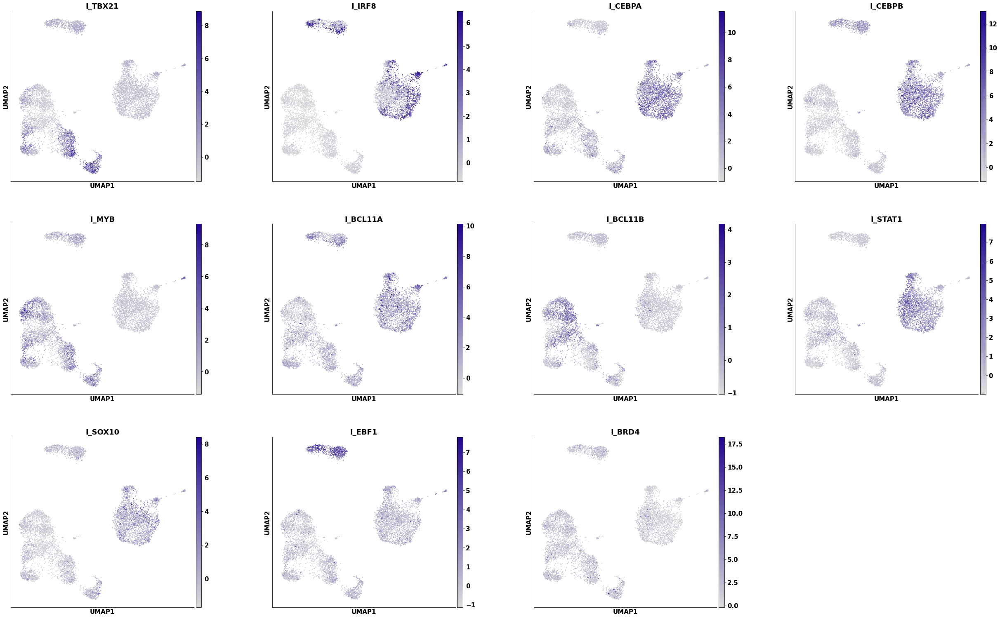

In [439]:
sc.pl.umap(test_adata, color=tf_list, wspace=0.3, color_map=regulation_cmp)

## chip impute

In [82]:
def get_motif_pattern_from_minimal(motif_file):
    with open(motif_file,'r') as handle:
        motif_record = motifs.parse(handle,'minimal')
    IUPAC_dict = {'R':'[AG]', 'Y':'[CT]', 'W':'[AT]', 'S':'[CG]', 'M':'[AC]', 'K':'[GT]', 'H':'[ACT]', 'B':'[CGT]', 'V':'[ACG]', 'D':'[AGT]', 'N':'[ACGT]'}
    motif_pattern = []
    for motif in motif_record:
        motif_seq = str(motif.degenerate_consensus)
        for k in IUPAC_dict.keys():
            motif_seq = motif_seq.replace(k, IUPAC_dict[k])
        motif_pattern.append(re.compile(motif_seq))
    return motif_pattern
        

In [61]:
ref_fa = pysam.FastaFile("/mnt/Storage/home/dongxin/Files/FASTA_REFERENCE/hg38.fa")

In [88]:
def filter_motif_peaks(peak, motif_pattern):
    motif_peak_dict = {}
    cnt = 0
    for interval in peak.df.T.to_dict().values():
        interval_seq = str(ref_fa.fetch(reference=interval['Chromosome'],
                                        start=interval['Start'], end=interval['End']).upper())
        interval_seq = interval_seq[int(interval_seq.__len__()/2)-250 : int(interval_seq.__len__()/2+250)]
        for p in motif_pattern:
            if p.findall(interval_seq) != []:
    #             print(p.findall(interval_seq))
                motif_peak_dict[cnt] = interval
                break
        cnt += 1
    motif_peak = pd.DataFrame(motif_peak_dict).T
    return motif_peak


In [129]:
factor = 'IRF4'

In [ ]:
cell_ch = test_adata.uns['integrated_TF'].sort_values(by='I_' + factor, ascending=False)['I_' + factor].index.to_list()[0]
motif_pattern = get_motif_pattern_from_minimal('/mnt/Storage2/home/dongxin/Projects/motif/human_cisBP/meme/%s.meme' % factor)
result = pd.read_csv('10X_ATAC/temp/test/fg_chip_result/%s.txt' % cell_ch, sep='\t', index_col = False).sort_values('combo_score', ascending=False)
bulk_bed = result[[factor in i  for i in result['#file']]]['#file'].to_list()[0]
# CGGACCATCCACACCT = pyranges.read_bed('10X_ATAC/temp/test/fg_bed/CGGACCATCCACACCT.bed.gz')
bulk_peak = pyranges.read_bed('/mnt/Storage/home/dongxin/Projects/scATAC/human/top10k/' + bulk_bed)
cell_peak = pyranges.from_dict(pd.DataFrame([i.split('_') for i in input_mat.index[input_mat.loc[:,cell_ch] >= 1]]).rename(columns={0:'Chromosome', 1:'Start', 2:'End'}))
cell_peak_ovlp_with_bluk = cell_peak.overlap(bulk_peak)

cell_peak_unique = cell_peak.overlap(bulk_peak, invert=True)
cell_peak_unique_motif = filter_motif_peaks(cell_peak_unique,motif_pattern)
tmp = pyranges.from_dict(pd.concat([cell_peak_unique_motif, cell_peak_ovlp_with_bluk.df]))

In [142]:
tmp

+--------------+-----------+-----------+
| Chromosome   | Start     | End       |
| (category)   | (int32)   | (int32)   |
|--------------+-----------+-----------|
| chr1         | 110338218 | 110339664 |
| chr1         | 110902835 | 110904544 |
| chr1         | 121458412 | 121458992 |
| chr1         | 13642556  | 13643304  |
| ...          | ...       | ...       |
| chrX         | 49100846  | 49101619  |
| chrX         | 49166287  | 49167680  |
| chrX         | 83634914  | 83635501  |
| chrX         | 9462843   | 9463469   |
+--------------+-----------+-----------+
Unstranded PyRanges object has 1,111 rows and 3 columns from 23 chromosomes.
For printing, the PyRanges was sorted on Chromosome.

In [141]:
tmp.to_bed('10X_ATAC/temp/%s_%s.bed' % (factor, cell_ch))

In [143]:
os.system('python ~/Projects/cidc_chips/modules/scripts/targets_RegPotential_Version2.py -p 10X_ATAC/temp/%s_%s.bed -a /mnt/Storage/home/dongxin/Storage2/Files/ref_files/hg38/hg38_refGene.bed -n 10X_ATAC/temp/%s_%s_gene_score.txt' % (factor, cell_ch,factor, cell_ch))

0

In [144]:
gene = pd.read_csv("10X_ATAC/temp/%s_%s_gene_score.txt" % (factor, cell_ch), sep='\t', header=None, comment='#').loc[:,[4,6]]

In [131]:
test_adata.obs.loc[cell_ch,:].head(10)

orig.ident           atac_pbmc_10k_v1_S1_L001
nCount_ATAC                              3331
nFeature_ATAC                            3331
ATAC_snn_res.0.6                            4
seurat_clusters                             4
nCount_ACTIVITY                       3647.46
nFeature_ACTIVITY                        8926
assign.ident                                B
assign.score                          1.67562
assign.celltype                             B
Name: TCACTCGCATCCCGGA, dtype: object

In [ ]:
test_adata.obs[test_adata.obs['assign.ident'] == 'CD8T'].sort_values('I_STAT3', ascending=False)

In [351]:
motif_file = "/mnt/Storage2/home/dongxin/Projects/motif/human_cisBP/meme/JUN.meme"
motif_pattern = get_motif_pattern_from_minimal(motif_file)

In [149]:
# c_inter.df.T.to_dict()

#     for motif in record:
#         print(motif.consensus in seq)

In [ ]:
pyranges(motif_peak)

In [366]:
pd.options.display.max_rows = None

In [ ]:
cell_peak_unique

## test

In [12]:
for cell_number in [10,20,30,40,50,70,100]:
    cell_cutoff = int(cell_number/2)
    peak_confidence = int(cell_number/10)

    result_adata = SCRIPT( processed_adata=seurat_adata, 
                          feature_matrix=input_mat, 
                          aggregate_peak_method="group", 
                          cell_number_per_group=cell_number, 
                          cell_cutoff=cell_cutoff, 
                          peak_confidence=peak_confidence, 
                          fg_bed_path='10X_ATAC/temp/per%s/bed' % str(cell_number), 
                          fg_map_dict_path='10X_ATAC/temp/per%s/map_dict.pk'% str(cell_number),  
                          bg_bed_path='10X_ATAC/temp/per%s/bg_bed'% str(cell_number), 
                          bg_map_dict_path='10X_ATAC/temp/per%s/bg_map_dict.pk'% str(cell_number), 
                          bg_iteration='auto',  
                          search_chip=True, 
                          chip_index=human_chip_index, 
                          fg_chip_result_path='10X_ATAC/temp/per%s/fg_chip_result'% str(cell_number), 
                          bg_chip_result_path='10X_ATAC/temp/per%s/bg_chip_result'% str(cell_number), 
                          search_motif=True, 
                          motif_index=human_motif_index, 
                          fg_motif_result_path='10X_ATAC/temp/per%s/fg_motif_result'% str(cell_number),
                          bg_motif_result_path='10X_ATAC/temp/per%s/bg_motif_result'% str(cell_number), 
                          integration=True, 
                          confirm=False, 
                          clean=True, 
                          n_cores=24
                         )

    result_adata.write('10X_ATAC/temp/per%s/per%s_adata.h5ad' % (str(cell_number),str(cell_number) ))

INFO 2020-11-09 17:58:47 Checking paramaters ...

~~~~~
Welcome to use SCRIPT. Here are your settings:

There are UMAP information and cluster information in your processed_adata. The aggregate peaks method is group.
This will aggregate 10 cells from the same cluster, the group with cell number less than 5 will not generate.
This setting is suitable for the background as well. SCRIPT randomly aggregates 10 cells and deletes the peaks confidence less than 1. This will iterate 7582 times.
The background peaks will be stored in 10X_ATAC/temp/per10/bg_bed, foreground peaks will be stored in 10X_ATAC/temp/per10/bed.
SCRIPT will search ChIP-seq and motif index both.
After that, SCRIPT will integrate into one result based on variability from each result.
ChIP-seq index locates at /mnt/Storage/home/dongxin/Projects/scATAC/index/300_top10k_giggle_TF_index.
ChIP-seq background result will be stored in 10X_ATAC/temp/per10/bg_chip_result, foreground result will be stored in 10X_ATAC/temp/per10/fg_

In [15]:
per10_result_adata = ad.read_h5ad('10X_ATAC/temp/per10/per10_adata.h5ad')
per20_result_adata = ad.read_h5ad('10X_ATAC/temp/per20/per20_adata.h5ad')
per30_result_adata = ad.read_h5ad('10X_ATAC/temp/per30/per30_adata.h5ad')
per40_result_adata = ad.read_h5ad('10X_ATAC/temp/per40/per40_adata.h5ad')
per50_result_adata = ad.read_h5ad('10X_ATAC/temp/per50/per50_adata.h5ad')
per70_result_adata = ad.read_h5ad('10X_ATAC/temp/per70/per70_adata.h5ad')
per100_result_adata = ad.read_h5ad('10X_ATAC/temp/per100/per100_adata.h5ad')

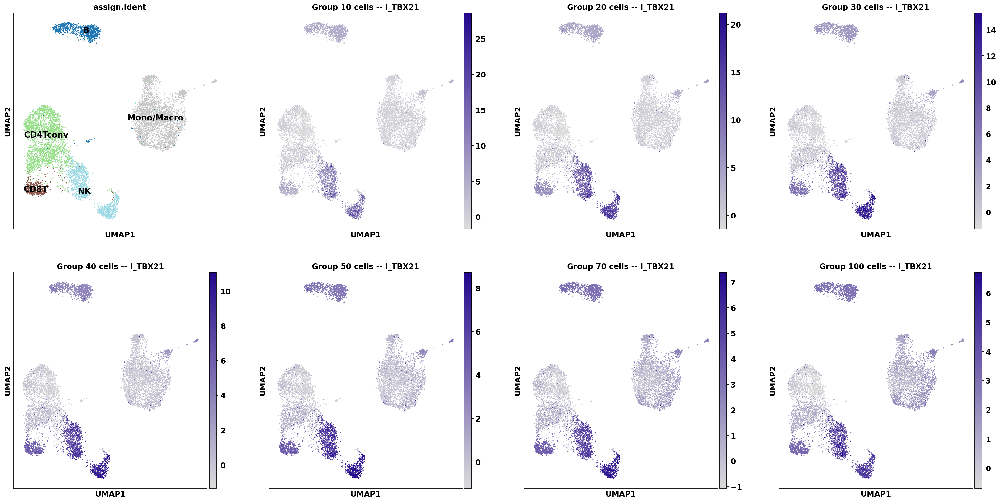

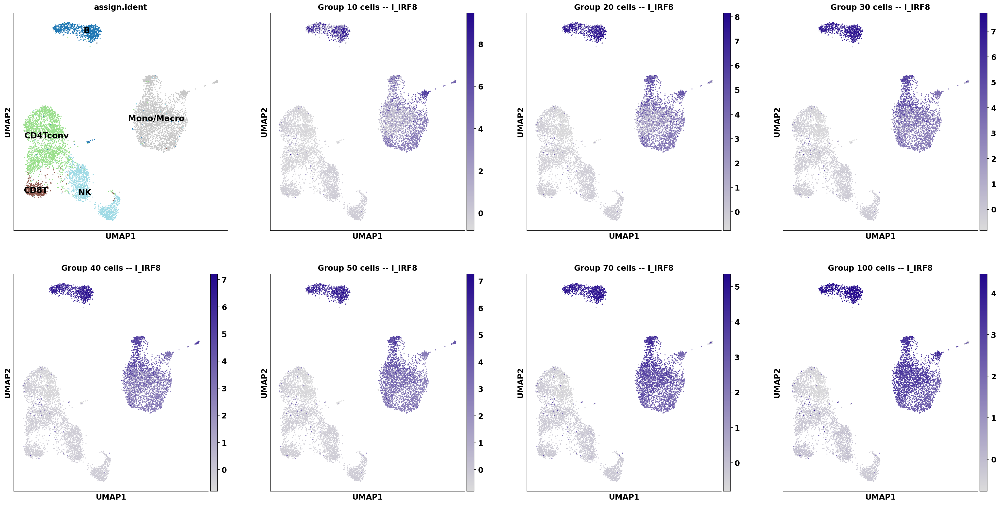

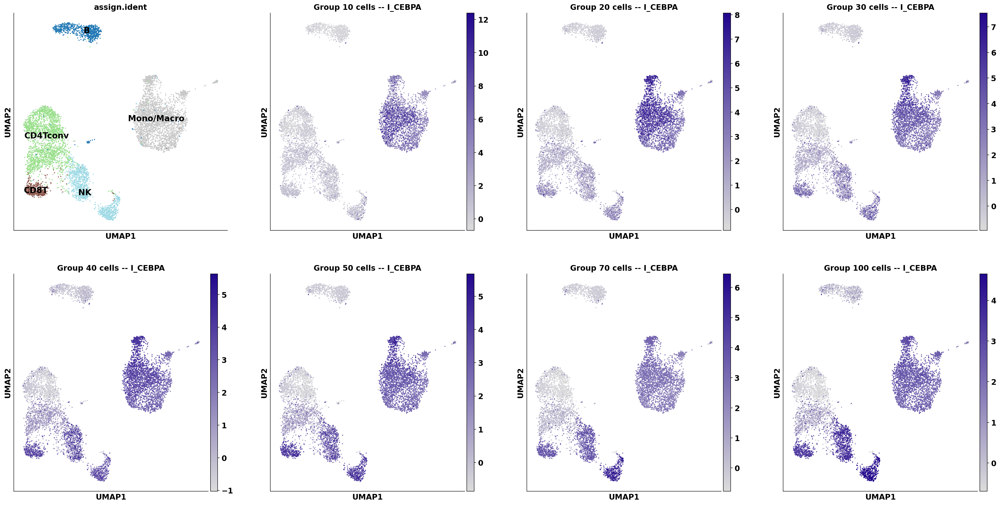

KeyboardInterrupt: 

In [196]:
for tf in tf_list:
    fig, ax = plt.subplots(2,4,figsize=(32, 16))
    sc.pl.umap(per10_result_adata, color='assign.ident', wspace=0.3, palette='tab20', ax=ax[0,0], legend_loc='on data', show=False)
    sc.pl.umap(per10_result_adata, color=[tf], wspace=0.3, color_map=regulation_cmp, title='Group 10 cells -- %s' % tf, ax=ax[0,1], show=False)
    sc.pl.umap(per20_result_adata, color=[tf], wspace=0.3, color_map=regulation_cmp, title='Group 20 cells -- %s' % tf, ax=ax[0,2], show=False)
    sc.pl.umap(per30_result_adata, color=[tf], wspace=0.3, color_map=regulation_cmp, title='Group 30 cells -- %s' % tf, ax=ax[0,3], show=False)
    sc.pl.umap(per40_result_adata, color=[tf], wspace=0.3, color_map=regulation_cmp, title='Group 40 cells -- %s' % tf, ax=ax[1,0], show=False)
    sc.pl.umap(per50_result_adata, color=[tf], wspace=0.3, color_map=regulation_cmp, title='Group 50 cells -- %s' % tf, ax=ax[1,1], show=False)
    sc.pl.umap(per70_result_adata, color=[tf], wspace=0.3, color_map=regulation_cmp, title='Group 70 cells -- %s' % tf, ax=ax[1,2], show=False)
    sc.pl.umap(per100_result_adata, color=[tf], wspace=0.3, color_map=regulation_cmp, title='Group 100 cells -- %s' %tf, ax=ax[1,3], show=False)
    plt.show()

In [ ]:
data = {}
cell_type = 'B'
for tf in tf_list:
    data[tf] = {}
#     data[tf]['per10'] = per10_result_adata.obs[per10_result_adata.obs['assign.ident']==cell_type][tf].mean()
#     data[tf]['per20'] = per20_result_adata.obs[per20_result_adata.obs['assign.ident']==cell_type][tf].mean()
#     data[tf]['per30'] = per30_result_adata.obs[per30_result_adata.obs['assign.ident']==cell_type][tf].mean()
#     data[tf]['per40'] = per40_result_adata.obs[per40_result_adata.obs['assign.ident']==cell_type][tf].mean()
#     data[tf]['per50'] = per50_result_adata.obs[per50_result_adata.obs['assign.ident']==cell_type][tf].mean()
#     data[tf]['per70'] = per70_result_adata.obs[per70_result_adata.obs['assign.ident']==cell_type][tf].mean()
#     data[tf]['per100'] = per100_result_adata.obs[per100_result_adata.obs['assign.ident']==cell_type][tf].mean()
    data[tf]['per10'] = per10_result_adata.obs[tf].mean()
    data[tf]['per20'] = per20_result_adata.obs[tf].mean()
    data[tf]['per30'] = per30_result_adata.obs[tf].mean()
    data[tf]['per40'] = per40_result_adata.obs[tf].mean()
    data[tf]['per50'] = per50_result_adata.obs[tf].mean()
    data[tf]['per70'] = per70_result_adata.obs[tf].mean()
    data[tf]['per100'] = per100_result_adata.obs[tf].mean()
data = pd.DataFrame(data)

plt.plot(data)
plt.legend(data.columns)
plt.title('Mean Regulation')# -- %s' %cell_type)
plt.show()

In [242]:
cell_number = 10
result_adata = SCRIPT( processed_adata=seurat_adata, 
                          feature_matrix=input_mat, 
                          aggregate_peak_method="nearest", 
                          cell_number_per_group=10, 
                          cell_cutoff=0, 
                          peak_confidence=2, 
                          fg_bed_path='10X_ATAC/temp/per%s/nn_bed' % str(cell_number), 
                          fg_map_dict_path='10X_ATAC/temp/per%s/nn_map_dict.pk'% str(cell_number),  
                          bg_bed_path='10X_ATAC/temp/per%s/bg_bed'% str(cell_number), 
                          bg_map_dict_path='10X_ATAC/temp/per%s/nn_bg_map_dict.pk'% str(cell_number), 
                          bg_iteration=2000,  
                          search_chip=True, 
                          chip_index='/mnt/Storage/home/dongxin/Projects/scATAC/index/300_top10k_giggle_TF_index', 
                          chip_index_prefix="top10k/", 
                          fg_chip_result_path='10X_ATAC/temp/per%s/nn_fg_chip_result'% str(cell_number), 
                          bg_chip_result_path='10X_ATAC/temp/per%s/nn_bg_chip_result'% str(cell_number), 
                          search_motif=True, 
                          motif_index='/mnt/Storage/home/dongxin/Projects/scATAC/index/motif_TF_index', 
                          motif_index_prefix="motif_bed/", 
                          fg_motif_result_path='10X_ATAC/temp/per%s/nn_fg_motif_result'% str(cell_number),
                          bg_motif_result_path='10X_ATAC/temp/per%s/nn_bg_motif_result'% str(cell_number), 
                          integration=True, 
                          confirm=False, 
                          clean=False, 
                          n_cores=24
                         )

result_adata.write('10X_ATAC/temp/per%s/per%s_nn_adata.h5ad' % (str(cell_number),str(cell_number) ))

INFO 2020-11-12 20:45:33 Checking paramaters ...
INFO 2020-11-12 20:45:33 WARNING: Background iteration number less than 10 times number of cell. May be not enough to estimate background.

~~~~~
Welcome to use SCRIPT. Here are your settings:

There are UMAP information and cluster information in your processed_adata. The aggregate peaks method is nearest.
This will borrow peaks from 10 nearest cells for every cell. For each cell, peaks confidence with less than 2 will be deleted.
SCRIPT randomly aggregates 10 cells and deletes the peaks confidence less than 2. This will iterate 2000 times.
The background peaks will be stored in 10X_ATAC/temp/per10/bg_bed, foreground peaks will be stored in 10X_ATAC/temp/per10/nn_bed.
SCRIPT will search ChIP-seq and motif index both.
After that, SCRIPT will integrate into one result based on variability from each result.
ChIP-seq index locates at /mnt/Storage/home/dongxin/Projects/scATAC/index/300_top10k_giggle_TF_index.
ChIP-seq background result will 

INFO 2020-11-13 02:02:13 Finished Generating merged anndata!


In [ ]:
sc.pl.umap(result_adata, color=tf_list, wspace=0.3, color_map=regulation_cmp)

# HSC 

In [2]:
peak = sc.read_10x_h5('HSC/data/bm/bm.h5', gex_only=False)

peak.var_names_make_unique()

other_name = [name for name in peak.var_names  if 'alt' in name]
other_name += [name for name in peak.var_names  if 'random' in name]
other_name += [name for name in peak.var_names  if 'chrUn' in name]
feature_indicator = np.in1d(peak.var_names, other_name)

remove_peak = peak[:,~feature_indicator]

peak_df = remove_peak.to_df().T

peak_df_int = peak_df.astype(int)

peak_sparse = sp.sparse.coo_matrix(peak_df_int)

sp.io.mmwrite('HSC/data/bm/remove_alt_10x/matrix.mtx', peak_sparse)

In [30]:
feature = [i for i in peak_df_int.columns.tolist()]

with open('HSC/data/bm/remove_alt_10x/barcodes.tsv','w+') as file:
    file.write('\n'.join(feature)+'\n')          

In [202]:
hsc_seurat_adata=read_SingleCellExperiment_rds('HSC/ATAC/HSC_single_cell_experiment.rds')

In [203]:
hsc_seurat_adata.write_h5ad("HSC/ATAC/HSC_single_cell_experiment.h5ad")

... storing 'assign.ident' as categorical
... storing 'assign.celltype' as categorical


In [ ]:
hsc_seurat_adata = ad.read_h5ad("HSC/ATAC/HSC_single_cell_experiment.h5ad")

In [204]:
hsc_inputMat = sc.read_10x_h5('HSC/data/bm/remove_alt_10x/remove_alt.h5', gex_only=False)

In [218]:
hsc_result_data = SCRIPT(processed_adata=hsc_seurat_adata, 
                    feature_matrix=hsc_inputMat, 
                    project='HSC/SCRIPT_result',
                    aggregate_peak_method="nearest", 
                    cell_number_per_group=10, 
                    cell_cutoff=5, 
                    peak_confidence=2, 
                    bg_iteration=2000,  
                    search_chip=True, 
                    chip_index=human_chip_index, 
                    search_motif=True, 
                    motif_index=human_motif_index, 
                    integration=True, 
                    confirm=True, 
                    store=True,
                    result_store_path='HSC/SCRIPT_result/per10nn_HSC_computed.h5ad',
                    clean=False, 
                    n_cores=24
                   )


INFO 2020-12-08 01:12:48 Checking paramaters ...
INFO 2020-12-08 01:12:48 WARNING: Background iteration number less than 5 times number of cell. May be not enough to estimate background.

~~~~~
Welcome to use SCRIPT. Here are your settings:

There are UMAP information and cluster information in your processed_adata. The aggregate peaks method is nearest.
This will borrow peaks from 10 nearest cells for every cell. For each cell, peaks that confidence is less than 2 will be deleted.
SCRIPT randomly aggregates 10 cells peaks and deletes the peaks that confidence less than 2. This will iterate 2000 times.
The background peaks will be stored in HSC/SCRIPT_result/bg_bed, foreground peaks will be stored in HSC/SCRIPT_result/fg_bed.
SCRIPT will search ChIP-seq and motif index both.
After that, SCRIPT will integrate into one result based on variability from each result.
ChIP-seq index locates at /mnt/Storage/home/dongxin/Projects/scATAC/index/human_ChIP_index.
ChIP-seq background result will b

 y


INFO 2020-12-08 01:12:49 WARNING: Using existing results, might wrong. If you want to rerun all results, press Ctrl-C to abort and delete HSC/SCRIPT_result/bg_bed
INFO 2020-12-08 01:12:49 WARNING: Using existing results, might wrong. If you want to rerun all results, press Ctrl-C to abort and delete HSC/SCRIPT_result/fg_bed
INFO 2020-12-08 01:12:50 WARNING: Using existing results, might wrong. If you want to rerun all results, press Ctrl-C to abort and delete HSC/SCRIPT_result/bg_chip_result
INFO 2020-12-08 01:12:50 WARNING: Using existing results, might wrong. If you want to rerun all results, press Ctrl-C to abort and delete HSC/SCRIPT_result/fg_chip_result
INFO 2020-12-08 01:12:50 Reading searching results, using 24 cores...
INFO 2020-12-08 01:12:57 Finished reading search results!
INFO 2020-12-08 01:12:57 Finished reading background ChIP-seq index search result!
INFO 2020-12-08 01:12:57 Reading searching results, using 24 cores...
INFO 2020-12-08 01:21:14 Finished reading search re

In [2]:
hsc_result_data = ad.read_h5ad('HSC/SCRIPT_result/per10nn_HSC_computed.h5ad')

In [235]:
rawanno = pd.read_csv('HSC/data/bm/raw_file/GSE123580_bonemarrow_cellData.tsv', sep='\t')

In [239]:
rawanno = rawanno.set_index('DropBarcode')

In [ ]:
rawanno.loc[hsc_result_data.obs.index,]['Cluster']

In [242]:
hsc_result_data.obs['raw_anno'] = rawanno.loc[hsc_result_data.obs.index,]['Cluster']

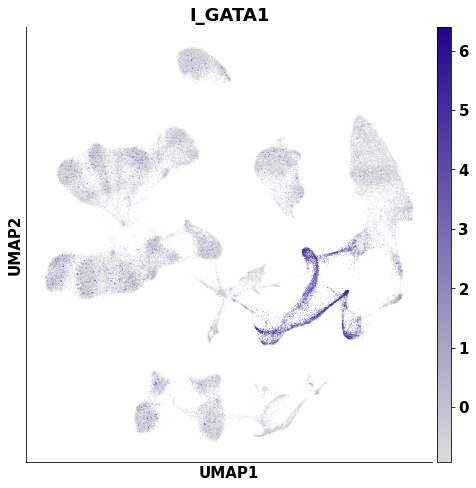

In [228]:
sc.pl.umap(hsc_result_data, color=['I_GATA1'], wspace=0.3, color_map=regulation_cmp)

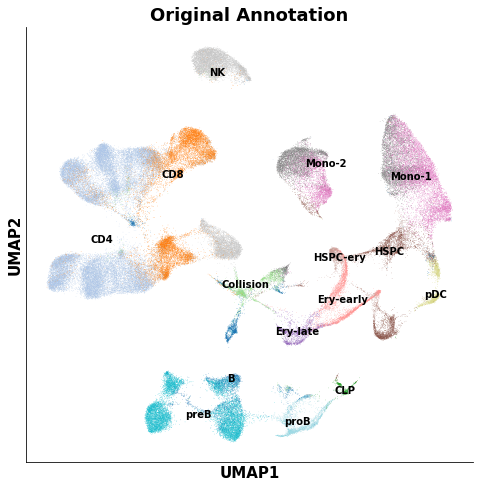

In [254]:
sc.pl.umap(hsc_result_data, color=['raw_anno'], wspace=0.3, palette='tab20', legend_loc='on data', title='Original Annotation', legend_fontsize=10)

In [239]:
hsc_result_data = ad.read('trash/HSC/per50/hsc_per50_group.h5ad')

# BCC

In [ ]:
BCC_seurat_adata=read_SingleCellExperiment_rds('BCC/ATAC/BCC_ATAC_single_cell_experiment.rds')

In [13]:
BCC_seurat_adata = ad.read_h5ad('BCC/ATAC/BCC_ATAC.h5ad')

In [14]:
BCC_input_mat = sc.read_10x_h5('BCC/data/GSE129785_BCC_scATAC_peak_count.h5', gex_only=False)

BCC_input_mat.var_names_make_unique()

Variable names are not unique. To make them unique, call `.var_names_make_unique`.


In [15]:
bcc_script_adata = SCRIPT(processed_adata=BCC_seurat_adata, 
                    feature_matrix=BCC_input_mat, 
                    project='BCC/SCRIPT_result/',
                    aggregate_peak_method="nearest", 
                    cell_number_per_group=10, 
                    cell_cutoff=3, 
                    peak_confidence=1, 
                    bg_iteration=1000,  
                    search_chip=True, 
                    chip_index=human_chip_index, 
                    search_motif=True, 
                    motif_index=human_motif_index, 
                    integration=True, 
                    confirm=False, 
                    store=True,
                    result_store_path='BCC/SCRIPT_result/BCC_script_computed_20201222.h5ad',
                    clean=False, 
                    n_cores=24
                   )

INFO 2020-12-22 18:09:18 Checking paramaters ...
INFO 2020-12-22 18:09:18 WARNING: Background iteration number less than 5 times number of cell. May be not enough to estimate background.

~~~~~
Welcome to use SCRIPT. Here are your settings:

There are UMAP information and cluster information in your processed_adata. The aggregate peaks method is nearest.
This will borrow peaks from 10 nearest cells for every cell. For each cell, peaks that confidence is less than 1 will be deleted.
SCRIPT randomly aggregates 10 cells peaks and deletes the peaks that confidence less than 1. This will iterate 1000 times.
The background peaks will be stored in BCC/SCRIPT_result//bg_bed, foreground peaks will be stored in BCC/SCRIPT_result//fg_bed.
SCRIPT will search ChIP-seq and motif index both.
After that, SCRIPT will integrate into one result based on variability from each result.
ChIP-seq index locates at /mnt/Storage/home/dongxin/Projects/scATAC/index/human_ChIP_index.
ChIP-seq background result will

In [27]:
bcc_script_adata = ad.read('BCC/SCRIPT_result/bcc_per10nn_result.h5ad')

In [71]:
bcc_script_adata.obs = bcc_script_adata.obs.drop(bcc_script_adata.obs.columns[11:], axis=1)

In [72]:
bcc_script_adata.obs = pd.concat([bcc_script_adata.obs, quantile_table.reindex(bcc_script_adata.obs.index.tolist())], axis=1)

In [ ]:
sc.pl.umap(bcc_script_adata, color=I_tf_list, wspace=0.3, color_map='RdGy_r')

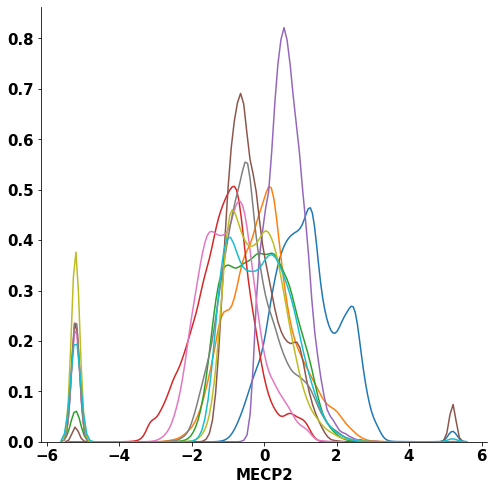

In [90]:
table = bcc_script_adata.uns['ChIP_p'].copy()
table = -np.log10(np.sqrt(table+1e-8)).T.apply(sp.stats.zscore, axis=0).T
# table = -np.log10(np.sqrt(table+1e-8))
quantile_table = pd.DataFrame(preprocessing.quantile_transform(table, axis=0, output_distribution='normal'))
quantile_table.columns=table.columns
quantile_table.index=table.index
for i in random.sample(range(0,table.columns.__len__()), 10):
    sns.distplot(quantile_table.iloc[:,i], hist=False)

In [29]:
quantile_table = pd.DataFrame(preprocessing.quantile_transform(table, axis=1, output_distribution='normal'))

quantile_table.columns=table.columns
quantile_table.index=table.index

In [33]:
quantile_table

,I_ZNF501,I_ZNF716,I_ZNF425,I_KLF10,I_ZBTB49,I_ZNF398,I_ZNF641,I_ZNF486,I_ZNF263,I_DBP,...,I_ZNF524,I_ZNF300,I_ZNF200,I_FOXB1,I_ZBTB45,I_HES5,I_TBX2,I_LHX1,I_LCOR,I_ZNF90
SU001_Tcell_Post#AACCAACTCCCGGGTA-1,0.165302,1.335495,0.094088,0.807786,0.628438,0.265301,0.389518,-0.116006,-0.270391,-0.427799,...,0.515856,-0.082560,-0.476952,0.551928,0.820012,-0.820588,-0.590322,-0.369973,1.008024,-0.216241
SU006_Tumor_Pre#CTTCCAGGTAGGTGAC-1,-0.592067,-0.140594,-0.423375,0.339917,0.583560,1.501281,1.002196,-1.270561,1.040205,-0.996209,...,2.168347,-0.377002,-2.024148,-1.622413,-0.917861,-1.557677,-1.860004,-1.826856,1.916735,-1.886229
SU006_Tumor_Pre#CGGACCATCCTCAAGA-1,-0.677233,-0.153027,-0.537358,0.537589,0.362368,1.518743,1.481479,-1.364678,1.415903,-1.135731,...,2.192350,0.839137,-2.080278,-1.648811,-1.339840,-1.744305,-1.898802,-1.953297,1.952279,-1.215260
SU001_Tcell_Post#GAAATGATCTGTTTAC-1,0.307892,0.613676,0.142055,-0.003756,0.001142,0.283247,-0.044930,0.784542,-0.199184,-0.104119,...,0.634291,0.283332,-0.173818,1.587145,-0.038028,-0.702367,-0.323697,-0.047383,0.318451,0.301980
SU001_Tcell_Post#CTTAATCGTATTCTCT-1,0.786408,1.879900,-0.447083,-0.005547,0.844604,0.062707,0.599962,-0.435172,-0.797553,-0.831101,...,0.708603,0.170735,-0.263653,0.663539,1.131976,-0.426320,-0.381623,-0.718285,0.591640,-0.195700
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
SU010_Total_Pre#CTAGGGCAGCGCAATG-1,1.069925,0.693278,0.435380,0.619513,0.371695,0.420716,0.887215,-0.795302,0.822127,-0.708755,...,1.406436,-0.271284,-0.868651,-1.099725,-1.031823,-0.827998,-0.866008,-1.299330,1.040852,-1.144646
SU010_Total_Pre#TCAGTTTCATTACCTT-1,0.599000,0.452369,0.781175,-0.806553,-0.019695,0.923498,-0.173878,0.007068,0.380235,0.336657,...,-0.773660,-0.910084,-0.941643,1.386322,-0.351581,-1.056098,-0.935036,2.073656,-0.334087,1.516267
SU010_Total_Pre#CTCGCTATCACGTGTA-1,0.488270,0.412494,0.685195,-0.988584,-0.037045,1.182180,-0.206462,-0.450761,0.296434,0.243511,...,-1.069094,-1.172595,-1.155325,0.255547,-0.805576,-1.140077,-1.110561,1.300161,-0.456487,0.128239
SU010_Total_Pre#CCTATTAGTCGACTGC-1,1.589193,-0.088344,-0.776281,-0.206072,0.127430,0.657376,-0.662363,-1.634630,0.659431,-1.661887,...,1.815101,-0.620634,-1.161150,-1.344379,-0.526170,-0.472179,-1.118451,-1.201433,1.589874,-1.424953


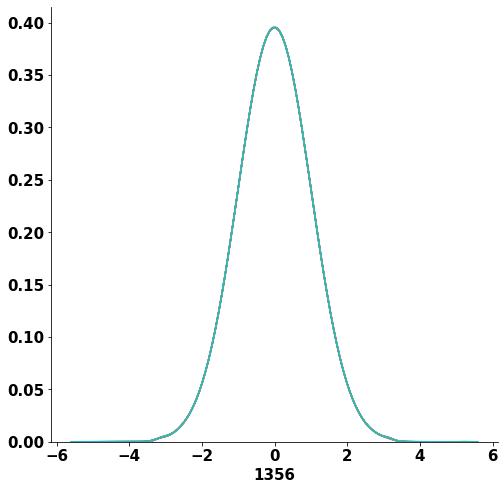

In [30]:
for i in random.sample(range(0,table.columns.__len__()), 10):
    sns.distplot(quantile_table.iloc[:,i], hist=False)

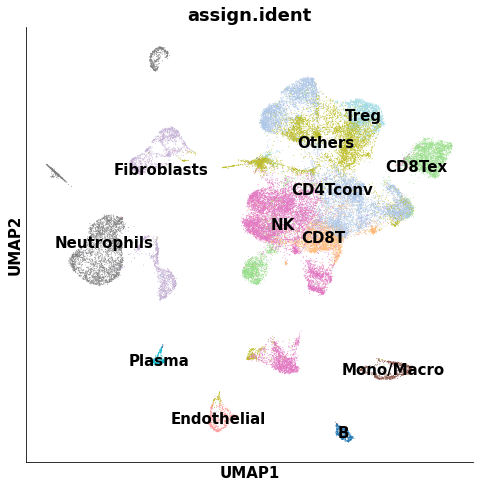

In [9]:
sc.pl.umap(bcc_script_adata, color=['assign.ident'], wspace=0.3, palette='tab20', legend_loc='on data')

In [7]:
bcc_script_adata.obs['original_annotation'] = 

,orig.ident,nCount_ATAC,nFeature_ATAC,ATAC_snn_res.0.6,seurat_clusters,nCount_ACTIVITY,nFeature_ACTIVITY,assign.ident,assign.score,assign.celltype,...,I_ZSCAN5,I_ZNF891,I_ONECUT3,I_TFAP2B,I_IKZF3,I_ZNF771,I_OTX1,I_TBX18,I_IRX4,I_KLF14
SU001_Tcell_Post#TATTGCTTCGGATCGC-1,SU001,3109.0,3109,0,0,3104.978936,7398,NK,0.506283,NK,...,-0.000563,-0.251058,0.031145,-0.189418,0.160346,-0.114309,-0.157921,0.115224,-0.371075,-0.088106
SU001_Tcell_Post#TGCACCTTCTGGCGCA-1,SU001,5892.0,5892,1,1,6203.080744,13194,CD8Tex,0.730435,CD8Tex,...,-0.112848,-0.344549,0.249953,-0.341301,-0.260037,-0.208173,0.387599,-0.400084,-0.344138,-0.400464
SU001_Tcell_Post#ACAGCGCTCTATACCT-1,SU001,9411.0,9411,1,1,8847.637864,18544,CD8Tex,0.730435,CD8Tex,...,-0.145976,-0.349513,-0.035725,-0.361947,-0.349701,-0.258955,0.000701,0.430136,-0.364734,-0.407253
SU001_Tcell_Post#GTGATCATCGCTCTAC-1,SU001,7317.0,7317,0,0,7520.893207,15568,NK,0.506283,NK,...,-0.114611,-0.273310,-0.139998,-0.190588,-0.095665,-0.402664,-1.397663,-0.149797,-0.301697,-0.276122
SU001_Tcell_Post#GGTACCGGTACAAATG-1,SU001,17545.0,17545,1,1,16244.464323,24990,CD8Tex,0.730435,CD8Tex,...,-0.240973,-0.349638,1.133629,-0.362475,-0.345697,-0.322685,-0.083193,-0.024287,-0.368799,-0.407147
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
SU005_Total_Post#CTAACTTGTTGGAGGT-1,SU005,3247.0,3247,14,14,2693.154559,8800,Others,0.000000,Others,...,-0.180391,-0.348987,-0.660131,-0.328258,-0.349820,-0.498313,-0.484507,-0.676345,-0.424532,-0.198585
SU005_Total_Post#CAAAGCTCACCTCGTT-1,SU005,2071.0,2071,8,8,1915.124001,5690,Treg,0.222285,Treg,...,0.266019,0.798576,1.732472,2.275420,-0.349813,-0.500743,0.489585,-0.672394,-0.400600,2.949074
SU005_Total_Post#GGGAACATCTCGCGTT-1,SU005,2656.0,2656,14,14,2219.371643,6724,Others,0.000000,Others,...,0.262383,-0.193194,2.490315,-0.362923,-0.349820,-0.498289,-0.091160,-0.633461,-0.427642,0.251065
SU005_Total_Post#AGCGTATAGCAGGAGG-1,SU005,2260.0,2260,14,14,2014.667404,6637,Others,0.000000,Others,...,-0.247260,-0.014596,4.218899,-0.362923,-0.349820,-0.499931,1.504519,-0.674664,-0.427972,0.605932


In [ ]:
bcc_script_adata.obs.columns[0:20]

In [ ]:
ztable = bcc_result_adata.obs.iloc[:,11:]

In [63]:
ztable.columns = [i.replace('C_',"") for i in ztable.columns]

In [65]:
ztable.to_csv('BCC_PBMC/SCRIPT_result/per20/ztable.txt')

# Mouse Brain

In [14]:
mouse_brain_seurat_adata=read_SingleCellExperiment_rds('GSE140203_SHARE_seq/brain/ATAC/mouse_brain_scATAC_singlecellexperiment.rds')

In [10]:
mouse_brain_seurat_adata = ad.read_h5ad('BCC/ATAC/BCC_ATAC.h5ad')

In [15]:
mouse_brain_input_mat = sc.read_10x_h5('GSE140203_SHARE_seq/data/brain/ATAC/peak_count.h5', gex_only=False)

mouse_brain_input_mat.var_names_make_unique()

In [17]:
mouse_brain_script_adata = SCRIPT(processed_adata=mouse_brain_seurat_adata, 
                    feature_matrix=mouse_brain_input_mat, 
                    project='GSE140203_SHARE_seq/brain/SCRIPT_result/',
                    aggregate_peak_method="nearest", 
                    cell_number_per_group=10, 
                    cell_cutoff=3, 
                    peak_confidence=2, 
                    bg_iteration='auto',  
                    search_chip=True, 
                    chip_index=mouse_chip_index, 
                    search_motif=False, 
#                     motif_index=human_motif_index, 
                    integration=False, 
                    confirm=True, 
                    store=True,
                    result_store_path='GSE140203_SHARE_seq/brain/SCRIPT_result/mouse_brain_script_computed.h5ad',
                    clean=False, 
                    n_cores=24
                   )

INFO 2020-12-14 14:41:35 Checking paramaters ...

~~~~~
Welcome to use SCRIPT. Here are your settings:

There are UMAP information and cluster information in your processed_adata. The aggregate peaks method is nearest.
This will borrow peaks from 10 nearest cells for every cell. For each cell, peaks that confidence is less than 2 will be deleted.
SCRIPT randomly aggregates 10 cells peaks and deletes the peaks that confidence less than 2. This will iterate 1647 times.
The background peaks will be stored in GSE140203_SHARE_seq/brain/SCRIPT_result//bg_bed, foreground peaks will be stored in GSE140203_SHARE_seq/brain/SCRIPT_result//fg_bed.
SCRIPT will search ChIP-seq index.
ChIP-seq index locates at /mnt/Storage/home/dongxin/Projects/scATAC/index/mouse_ChIP_index.
ChIP-seq background result will be stored in GSE140203_SHARE_seq/brain/SCRIPT_result//bg_chip_result, foreground result will be stored in GSE140203_SHARE_seq/brain/SCRIPT_result//fg_chip_result.
Computed result will be stored in 

 y


INFO 2020-12-14 14:41:39 Start generating background beds ...
INFO 2020-12-14 14:42:51 Finished generating background beds!
INFO 2020-12-14 14:42:51 Start generating nearest neighbor cells beds ...
INFO 2020-12-14 14:46:00 Finished generating nearest neighbor cells beds!
INFO 2020-12-14 14:46:00 Start searching background beds from ChIP-seq index ...
INFO 2020-12-14 14:46:36 Finished searching background beds from ChIP-seq index!
INFO 2020-12-14 14:46:36 Start searching foreground beds from ChIP-seq index ...
INFO 2020-12-14 14:47:36 Finished searching factors from ChIP-seq index!
INFO 2020-12-14 14:47:36 Reading searching results, using 24 cores...
INFO 2020-12-14 14:47:39 Finished reading background ChIP-seq index search result!
INFO 2020-12-14 14:47:39 Reading searching results, using 24 cores...
INFO 2020-12-14 14:47:43 Finished reading foreground ChIP-seq index search result!
INFO 2020-12-14 14:47:43 Calculating enrichment, divide into 24 chunks...
INFO 2020-12-14 14:47:44 chunk 0

... storing 'assign.ident' as categorical
... storing 'assign.celltype' as categorical


INFO 2020-12-14 14:49:57 Finished Generating merged anndata!


In [3]:
mouse_brain_script_adata = ad.read('GSE140203_SHARE_seq/brain/SCRIPT_result/mouse_brain_script_computed.h5ad')

In [37]:
mouse_brain_script_adata.obs.keys()

Index(['orig.ident', 'nCount_ATAC', 'nFeature_ATAC', 'ATAC_snn_res.0.6',
       'seurat_clusters', 'nCount_ACTIVITY', 'nFeature_ACTIVITY',
       'assign.ident', 'assign.score', 'assign.celltype',
       ...
       'C_ZIC1or2', 'C_ZIC2', 'C_ZIC3', 'C_ZKSCAN1', 'C_ZMIZ1', 'C_ZMYND8',
       'C_ZNF143', 'C_ZNF322A', 'C_ZNF335', 'C_ZNF384'],
      dtype='object', length=669)

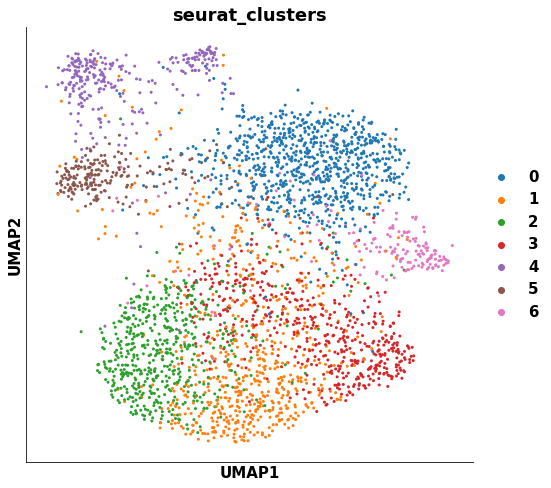

In [38]:
sc.pl.umap(mouse_brain_script_adata, color='seurat_clusters', wspace=0.3, color_map=regulation_cmp)

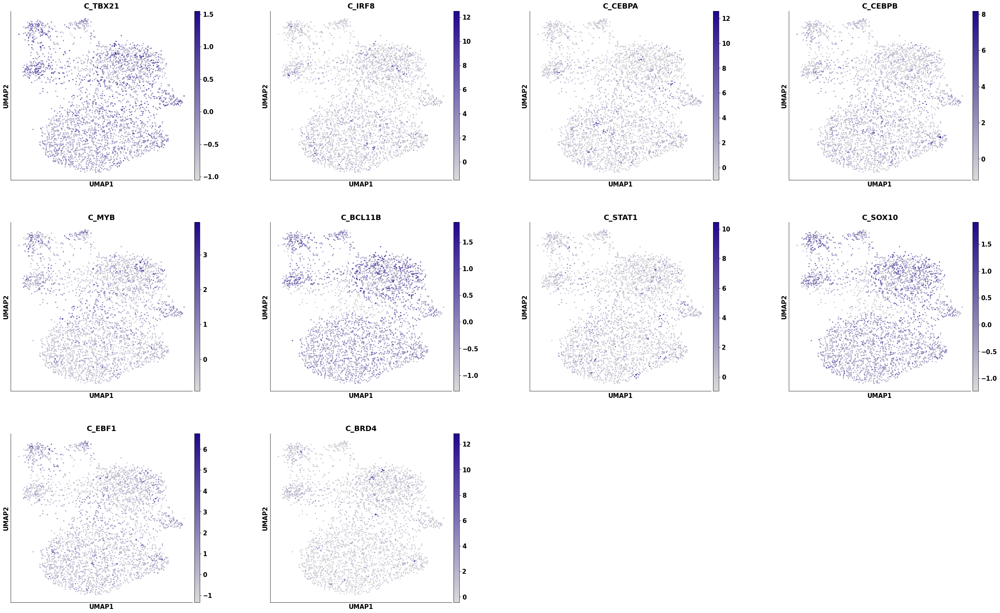

In [32]:
sc.pl.umap(mouse_brain_script_adata, color=['C_TBX21', 'C_IRF8', 'C_CEBPA', 'C_CEBPB', 'C_MYB',  'C_BCL11B', 'C_STAT1', 'C_SOX10', 'C_EBF1', 'C_BRD4'], wspace=0.3, color_map=regulation_cmp)

# Plot

## - BCC

In [12]:
expression = pd.read_csv('BCC/RNA/expression.cluster.txt', sep='\t')
expression = np.log(expression + 0.00001)

chromVAR_table = pd.read_csv('BCC/chromVAR_z_table.txt', sep='\t')

script_table = ad.read_h5ad('BCC/SCRIPT_result/bcc_per10nn_result.h5ad').uns['integrated_TF']

metadata = pd.read_csv('BCC/integrated/BCC_integrated_metadata.tsv', sep='\t', low_memory=False)


### SCRIPT chromVAR Expression

In [15]:
chromVAR_dict = {}
SCRIPT_dict = {}
for i in expression.columns:
    locals()[i+'_cells'] = metadata[(metadata['tech'] == 'ATAC') & (metadata['assign.ident'] == i)].index
    locals()[i] = chromVAR_table.loc[locals()[i+'_cells'],].mean()
    chromVAR_dict[i] = locals()[i]
    locals()[i] = script_table.loc[locals()[i+'_cells'],].mean()
    SCRIPT_dict[i] = locals()[i]

In [16]:
SCRIPT = pd.DataFrame(SCRIPT_dict)
chromVAR = pd.DataFrame(chromVAR_dict)

In [17]:
SCRIPT.index = [i[2:] for i in SCRIPT.index]

In [18]:
SCRIPT = SCRIPT.drop(['CPEB1','ZNF354C'])

In [19]:
ovlp_factor = list(set(SCRIPT.index.to_list()) & set(chromVAR.index.to_list()) & set(expression.index.to_list()))

In [20]:
ovlp_factor

['TBX5',
 'SMARCC1',
 'ERG',
 'CENPB',
 'FOXO3',
 'EGR4',
 'PBX1',
 'MAFK',
 'NR1H3',
 'E2F6',
 'BHLHE40',
 'NFE2L2',
 'KLF12',
 'MAFB',
 'TBP',
 'E2F1',
 'OSR1',
 'IRF3',
 'ETV6',
 'USF2',
 'JUNB',
 'BATF3',
 'RFX1',
 'RUNX3',
 'CREB1',
 'ZHX1',
 'MYB',
 'ID3',
 'FLI1',
 'TBX3',
 'IRF4',
 'PAX9',
 'ATF3',
 'SMARCC2',
 'INSM1',
 'POU2F1',
 'FOXA3',
 'BCL6',
 'KLF5',
 'CRX',
 'HLX',
 'STAT3',
 'RUNX2',
 'ZNF691',
 'TCF21',
 'EBF1',
 'ETS2',
 'CBFB',
 'ARNT2',
 'AHRR',
 'PAX8',
 'TBX4',
 'HAND2',
 'ONECUT2',
 'DBP',
 'ZNF75D',
 'CDX2',
 'HOXA4',
 'ZEB1',
 'ZBTB42',
 'STAT6',
 'BATF',
 'GATA6',
 'HOXA6',
 'MAX',
 'NR3C2',
 'GMEB2',
 'MEF2A',
 'ZNF589',
 'YBX1',
 'TBX1',
 'NR2C2',
 'TEAD3',
 'ERF',
 'PKNOX1',
 'KLF9',
 'ZNF202',
 'MAF',
 'PBX2',
 'ZNF32',
 'NR5A2',
 'MITF',
 'ELF3',
 'AHR',
 'HIC1',
 'MSX1',
 'NFATC2',
 'HEY2',
 'ZNF232',
 'CREB3L2',
 'NR1H2',
 'HIF1A',
 'CEBPA',
 'GATA3',
 'TGIF2',
 'HBP1',
 'IRX6',
 'PAX6',
 'OSR2',
 'IRX1',
 'HMX2',
 'FOXP1',
 'STAT4',
 'E2F3',
 'FOXM1'

In [21]:
for i in expression.columns:
    expression_sub = expression.loc[ovlp_factor, i]
    chromVAR_sub = chromVAR.loc[ovlp_factor, i]
    SCRIPT_sub = SCRIPT.loc[ovlp_factor, i]
    locals()[i+'_table'] = pd.DataFrame({'expression':expression_sub, 'chromVAR':chromVAR_sub, 'SCRIPT':SCRIPT_sub})

In [23]:
MonoMac_table

,expression,chromVAR,SCRIPT
TBX5,-11.512925,-2.259289,-0.223455
SMARCC1,-0.997669,6.644047,0.149223
ERG,-4.567137,0.968048,0.199909
CENPB,2.371906,-0.161395,1.673644
FOXO3,1.159748,-1.151653,-0.764611
...,...,...,...
HNF1B,-11.512925,-0.310273,-0.473409
BCL11B,-4.470147,8.009727,-0.534343
RARB,-11.512925,0.527462,-0.193572
ALX3,-11.512925,-0.973826,1.021041


In [ ]:
MonoMac_table[MonoMac_table['SCRIPT'] > 4]

In [183]:
expression.columns

Index(['CD8Teff', 'Treg', 'B', 'CD4Tconv', 'MonoMac', 'Malignant', 'Plasma',
       'CAF', 'pDC', 'TProliferation', 'Endothelial', 'NK', 'mDC'],
      dtype='object')

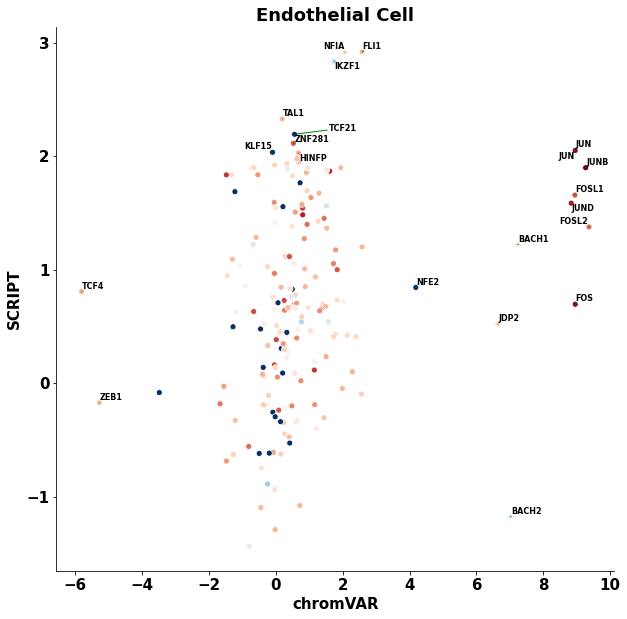

In [591]:
cell = 'Endothelial'
data = locals()[cell + "_table"]
fig, ax = plt.subplots(1,1,figsize=(10,10))
sns.scatterplot(data=data, x='chromVAR', y='SCRIPT', hue='expression', palette='RdBu_r', ax=ax, legend=False)
ax.set_title('%s Cell' % cell)
texts = []
for i in range(len(data.index)):
    if abs(data.iloc[i,1]) > 4:
        texts.append(plt.text(data.iloc[i,1], data.iloc[i,2], data.index[i], size=8))
    if data.iloc[i,2] > 2:
        texts.append(plt.text(data.iloc[i,1], data.iloc[i,2], data.index[i], size=8))
adjust_text(texts, arrowprops=dict(arrowstyle='-', color='green'))
fig.show()

### Recall ratio

In [24]:
with open('TF_names_v_1.01.txt', 'r') as file_handle:    
    TF_list = [i.rstrip('\n') for i in file_handle.readlines()]

In [25]:
tf_ovlp_factor = list(set(TF_list) & set(expression.index))

In [28]:
script_motif_table = bcc_script_adata.uns['motif_z'].copy()

In [29]:
script_ChIP_table = bcc_script_adata.uns['ChIP_z'].copy()

In [30]:
script_table = bcc_script_adata.uns['integrated_TF'].copy()
script_table.columns=[i[2:] for i in script_table.columns]
script_table = script_table.drop(['CPEB1', 'ZNF354C'], axis=1)

In [31]:
ovlp_factor = set(expression.index) & set(script_table.columns) & set(chromVAR_table.columns) & set(script_ChIP_table.columns) & set(script_motif_table.columns)

In [32]:
ovlp_factor.__len__()

178

In [37]:
set(expression[expression['CD8Teff']>1].index)

Index(['FO538757.2', 'LINC00115', 'NOC2L', 'HES4', 'ISG15', 'TNFRSF18',
       'TNFRSF4', 'SDF4', 'B3GALT6', 'UBE2J2',
       ...
       'IGLC2', 'IGKV3-15', 'ACTRT3', 'IGHV2-5', 'IGHV3-23', 'IGHV3-73',
       'IGLV1-41', 'IGLV3-19', 'IGLV3-1', 'IGLC3'],
      dtype='object', length=5187)

In [58]:
result = {}
for cell in expression.columns:
#     expression100 = set(expression.loc[ovlp_factor,cell].sort_values(ascending=False)[0:50].index)
    expression100 = set(expression[expression[cell]>np.median(expression[cell])].index)
    cell_bc = metadata[(metadata['assign.ident'] == cell) & (metadata['tech'] == 'ATAC')].index
    chromvar100 = set(chromVAR_table.loc[cell_bc, ovlp_factor].mean().sort_values(ascending=False)[0:100].index)
    script100 = set(script_table.loc[cell_bc, ovlp_factor].mean().sort_values(ascending=False)[0:100].index)
    script_motif_100 = set(script_motif_table.loc[cell_bc, ovlp_factor].mean().sort_values(ascending=False)[0:100].index)
    script_chip_100 = set(script_ChIP_table.loc[cell_bc, ovlp_factor].mean().sort_values(ascending=False)[0:100].index)
    result[cell] = {'chromvar':expression100.intersection(chromvar100).__len__(),
                    'script_integrate':expression100.intersection(script100).__len__(),
                   'script_motif (not full)':expression100.intersection(script_motif_100).__len__(),
                   'script_ChIP':expression100.intersection(script_chip_100).__len__(),}
#                     'consistant':chromvar100.intersection(script100).__len__()}
result = pd.DataFrame(result)

data = (result/100).T.melt()

data['type'] = list(result.columns)*4

In [40]:
data

,variable,value,type
0,chromvar,13,CD8Teff
1,chromvar,16,Treg
2,chromvar,15,B
3,chromvar,15,CD4Tconv
4,chromvar,29,MonoMac
5,chromvar,33,Malignant
6,chromvar,6,Plasma
7,chromvar,28,CAF
8,chromvar,21,pDC
9,chromvar,23,TProliferation


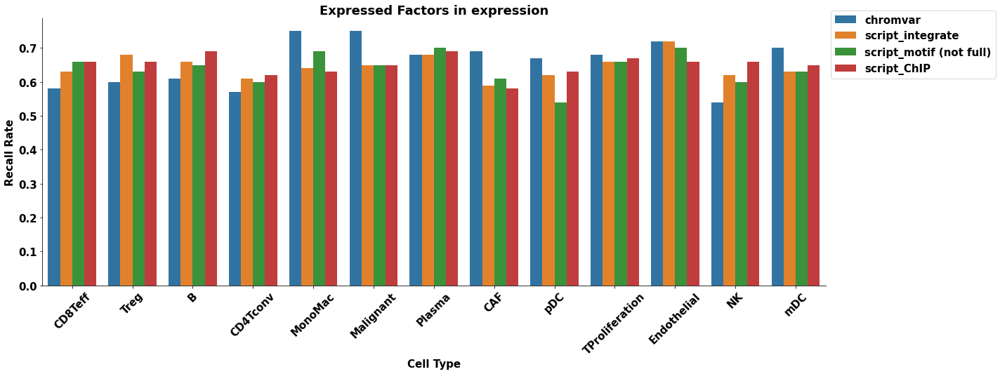

In [59]:
fig, ax = plt.subplots(figsize=(20,7))
sns.barplot(data=data, x="type", y="value", hue="variable")
plt.xticks(rotation=45)
ax.legend(bbox_to_anchor=(1, 1.05))
ax.set_xlabel('Cell Type')
ax.set_ylabel('Recall Rate')
ax.set_title('Expressed Factors in expression')
fig.show()

### NMI

In [ ]:
sns.distplot(chromVAR_table_file['TCF7'])

In [35]:
script_table = script_table.replace([np.inf, -np.inf], np.nan)
script_table = script_table.dropna(axis=1,how='any')

In [37]:
for i in script_table.index:
    print(i + '\t' + str(np.std(script_table.loc[i,])))


,OVOL2,ZNF248,KMT2A,TFAP2A,ZNF84,MEF2B,ZNF467,ZNF175,ZNF425,EGR3,...,ZSCAN5,ZNF891,ONECUT3,TFAP2B,IKZF3,ZNF771,OTX1,TBX18,IRX4,KLF14
SU001_Tcell_Post#AACCAACTCCCGGGTA-1,-0.590363,-0.803427,-0.371190,-0.536152,-0.341112,0.734631,-0.331877,-0.606204,-0.432432,-0.344972,...,-0.251905,-0.349088,1.100704,-0.361671,-0.340551,-0.092877,-0.112988,-0.219654,-0.293433,-0.407180
SU006_Tumor_Pre#CTTCCAGGTAGGTGAC-1,2.254428,-0.836073,-0.371315,1.262527,1.201996,-0.946741,1.260741,-1.290973,-0.432860,1.290695,...,-0.124059,-0.132682,-1.244869,0.478524,-0.333205,5.071288,1.178518,2.866860,5.384084,-0.407210
SU006_Tumor_Pre#CGGACCATCCTCAAGA-1,2.499256,-0.836073,-0.368455,1.017985,1.490323,-1.045818,1.561763,-1.290973,-0.432860,3.798877,...,0.296201,0.374351,-1.244869,0.759558,-0.278634,5.071288,-0.387347,2.813149,5.384115,-0.406605
SU001_Tcell_Post#GAAATGATCTGTTTAC-1,-0.416520,0.162744,-0.367343,-0.441707,0.033529,2.031254,-0.331793,-0.391801,-0.431713,-0.343785,...,-0.483932,-0.346447,0.113897,-0.359923,-0.333044,-0.161040,0.017074,-0.492187,-0.327150,-0.404766
SU001_Tcell_Post#CTTAATCGTATTCTCT-1,-0.280891,-0.035339,-0.369377,-0.431902,-0.009759,1.545511,-0.331804,-0.281013,-0.432623,-0.344565,...,-0.516127,-0.348334,-1.234990,-0.354003,-0.325912,0.013730,-0.532648,-0.575134,-0.123212,-0.405759
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
SU010_Total_Pre#CTAGGGCAGCGCAATG-1,-0.006231,-0.754751,-0.294460,0.000206,0.219437,2.031255,-0.253231,-1.214509,-0.132876,-0.236830,...,-0.088804,-0.120838,-1.207111,-0.085598,-0.067592,-0.130523,-1.411452,-0.641262,0.959766,-0.382612
SU010_Total_Pre#TCAGTTTCATTACCTT-1,-0.601786,-0.461449,-0.371512,-0.306322,-0.732446,1.574831,-0.331877,-0.734731,-0.432860,-0.345007,...,-0.522734,-0.349716,0.370168,-0.362920,-0.341519,-0.449394,1.644680,-0.534902,-0.397240,-0.407273
SU010_Total_Pre#CTCGCTATCACGTGTA-1,-0.601786,-0.836073,-0.371512,0.466765,-0.677616,1.338617,-0.331878,-0.190057,-0.432860,-0.345007,...,-0.522769,-0.349718,-0.682427,-0.362923,-0.349667,-0.463351,1.578782,-0.549788,-0.413981,-0.407273
SU010_Total_Pre#CCTATTAGTCGACTGC-1,6.058073,-0.358310,-0.278335,0.422167,5.033321,2.031255,0.085682,-1.223809,-0.190831,-0.137362,...,-0.160442,-0.130548,-1.206530,0.004581,-0.078711,0.658469,-1.390385,-0.536403,1.355100,-0.385298


In [38]:
script_table

,OVOL2,ZNF248,KMT2A,TFAP2A,ZNF84,MEF2B,ZNF467,ZNF175,ZNF425,EGR3,...,ZSCAN5,ZNF891,ONECUT3,TFAP2B,IKZF3,ZNF771,OTX1,TBX18,IRX4,KLF14
SU001_Tcell_Post#AACCAACTCCCGGGTA-1,-0.590363,-0.803427,-0.371190,-0.536152,-0.341112,0.734631,-0.331877,-0.606204,-0.432432,-0.344972,...,-0.251905,-0.349088,1.100704,-0.361671,-0.340551,-0.092877,-0.112988,-0.219654,-0.293433,-0.407180
SU006_Tumor_Pre#CTTCCAGGTAGGTGAC-1,2.254428,-0.836073,-0.371315,1.262527,1.201996,-0.946741,1.260741,-1.290973,-0.432860,1.290695,...,-0.124059,-0.132682,-1.244869,0.478524,-0.333205,5.071288,1.178518,2.866860,5.384084,-0.407210
SU006_Tumor_Pre#CGGACCATCCTCAAGA-1,2.499256,-0.836073,-0.368455,1.017985,1.490323,-1.045818,1.561763,-1.290973,-0.432860,3.798877,...,0.296201,0.374351,-1.244869,0.759558,-0.278634,5.071288,-0.387347,2.813149,5.384115,-0.406605
SU001_Tcell_Post#GAAATGATCTGTTTAC-1,-0.416520,0.162744,-0.367343,-0.441707,0.033529,2.031254,-0.331793,-0.391801,-0.431713,-0.343785,...,-0.483932,-0.346447,0.113897,-0.359923,-0.333044,-0.161040,0.017074,-0.492187,-0.327150,-0.404766
SU001_Tcell_Post#CTTAATCGTATTCTCT-1,-0.280891,-0.035339,-0.369377,-0.431902,-0.009759,1.545511,-0.331804,-0.281013,-0.432623,-0.344565,...,-0.516127,-0.348334,-1.234990,-0.354003,-0.325912,0.013730,-0.532648,-0.575134,-0.123212,-0.405759
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
SU010_Total_Pre#CTAGGGCAGCGCAATG-1,-0.006231,-0.754751,-0.294460,0.000206,0.219437,2.031255,-0.253231,-1.214509,-0.132876,-0.236830,...,-0.088804,-0.120838,-1.207111,-0.085598,-0.067592,-0.130523,-1.411452,-0.641262,0.959766,-0.382612
SU010_Total_Pre#TCAGTTTCATTACCTT-1,-0.601786,-0.461449,-0.371512,-0.306322,-0.732446,1.574831,-0.331877,-0.734731,-0.432860,-0.345007,...,-0.522734,-0.349716,0.370168,-0.362920,-0.341519,-0.449394,1.644680,-0.534902,-0.397240,-0.407273
SU010_Total_Pre#CTCGCTATCACGTGTA-1,-0.601786,-0.836073,-0.371512,0.466765,-0.677616,1.338617,-0.331878,-0.190057,-0.432860,-0.345007,...,-0.522769,-0.349718,-0.682427,-0.362923,-0.349667,-0.463351,1.578782,-0.549788,-0.413981,-0.407273
SU010_Total_Pre#CCTATTAGTCGACTGC-1,6.058073,-0.358310,-0.278335,0.422167,5.033321,2.031255,0.085682,-1.223809,-0.190831,-0.137362,...,-0.160442,-0.130548,-1.206530,0.004581,-0.078711,0.658469,-1.390385,-0.536403,1.355100,-0.385298


In [39]:
sudo_expression_SCRIPT = ad.AnnData(script_table)

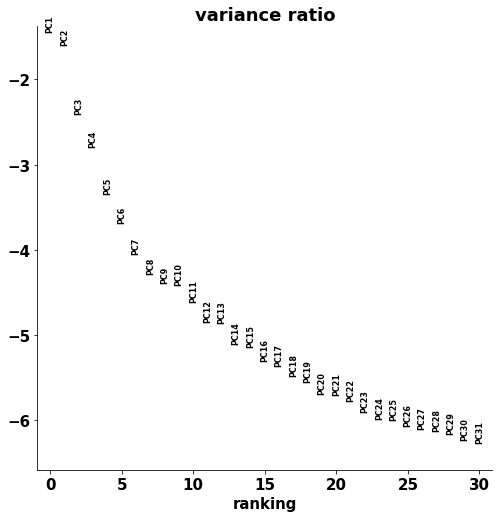

/mnt/Storage/home/dongxin/Applications/miniconda3/lib/python3.8/site-packages/sklearn/manifold/_spectral_embedding.py:236: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"


In [40]:
sc.tl.pca(sudo_expression_SCRIPT, svd_solver='arpack')
sc.pl.pca_variance_ratio(sudo_expression_SCRIPT, log=True)
sc.pp.neighbors(sudo_expression_SCRIPT, n_neighbors=10, n_pcs=40)
sc.tl.umap(sudo_expression_SCRIPT)

In [43]:
sc.tl.louvain(sudo_expression_SCRIPT, resolution=0.6)

In [41]:
sudo_expression_SCRIPT.obs['cell_type']=gold_cluster[sudo_expression_SCRIPT.obs.index]

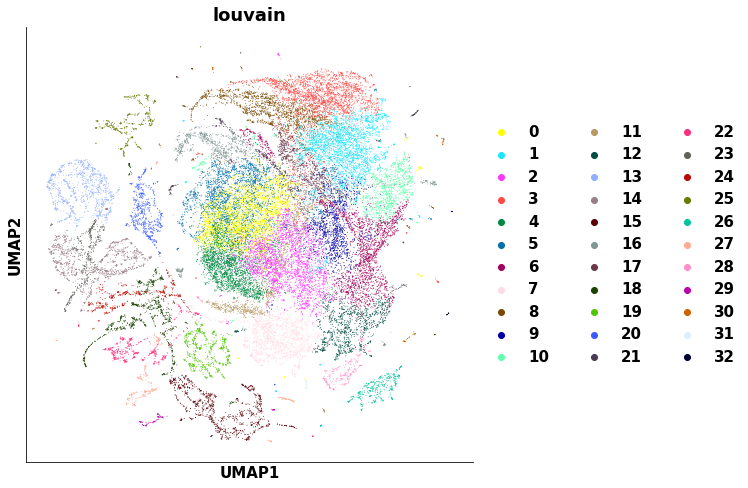

In [44]:
sc.pl.umap(sudo_expression_SCRIPT, color='louvain')

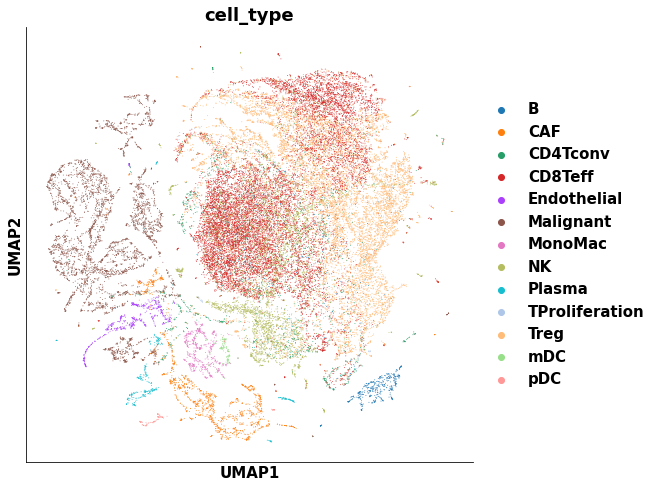

In [48]:
sc.pl.umap(sudo_expression_SCRIPT, color='cell_type')

In [10]:
chromVAR_table_file = pd.read_csv('BCC/chromVAR_z_table.txt', sep='\t')

In [11]:
chromVAR_table = chromVAR_table_file.replace([np.inf, -np.inf], np.nan)
chromVAR_table = chromVAR_table.dropna(axis=1,how='any')

In [12]:
sudo_expression_chromVAR = ad.AnnData(chromVAR_table)

In [445]:
sudo_expression_chromVAR

AnnData object with n_obs × n_vars = 37818 × 869

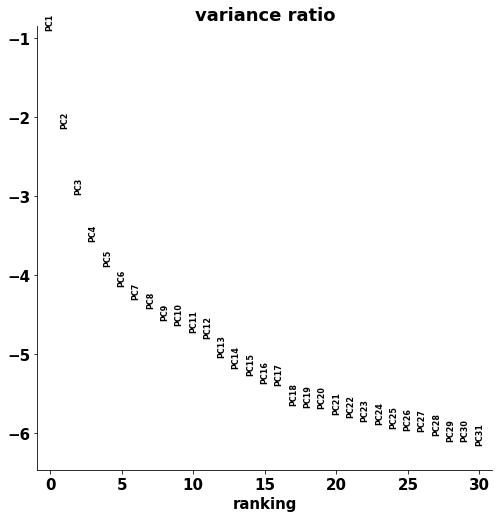

In [13]:
sc.tl.pca(sudo_expression_chromVAR, svd_solver='arpack')
sc.pl.pca_variance_ratio(sudo_expression_chromVAR, log=True)
sc.pp.neighbors(sudo_expression_chromVAR, n_neighbors=10, n_pcs=40)
sc.tl.umap(sudo_expression_chromVAR)

In [14]:
sc.tl.louvain(sudo_expression_chromVAR, resolution=0.8)

In [20]:
sudo_expression_chromVAR.obs['cell_type']=gold_cluster[sudo_expression_chromVAR.obs.index]

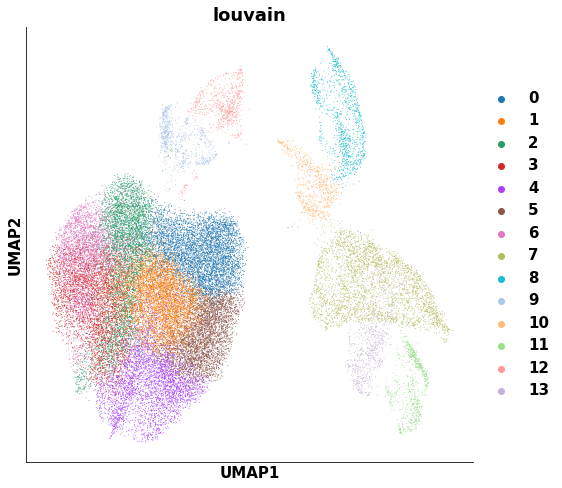

In [15]:
sc.pl.umap(sudo_expression_chromVAR, color='louvain')

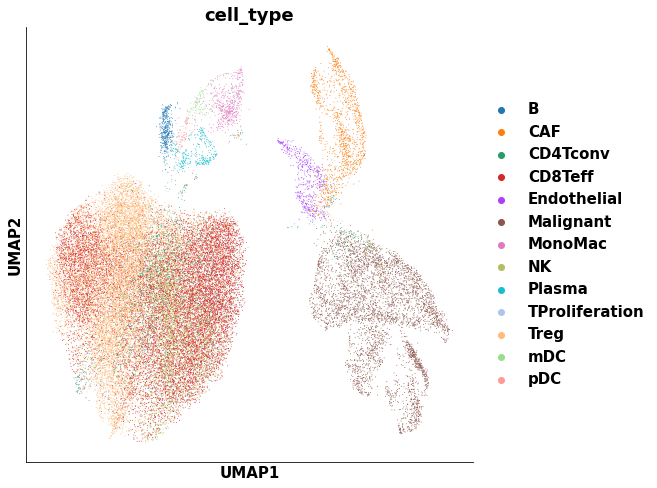

In [456]:
sc.pl.umap(sudo_expression_chromVAR, color='cell_type')

In [19]:
gold_cluster = metadata[metadata['tech']=='ATAC']['assign.ident']

In [23]:
real = gold_cluster[sudo_expression_chromVAR.obs.index]

In [45]:
script_nmi = sudo_expression_SCRIPT.obs['louvain'][sudo_expression_chromVAR.obs.index]
# chromvar_nmi = sudo_expression_chromVAR.obs['louvain'][sudo_expression_chromVAR.obs.index]

In [46]:
sklearn.metrics.normalized_mutual_info_score(real, script_nmi)

0.43982752132746

In [24]:
sklearn.metrics.normalized_mutual_info_score(real, chromvar_nmi)

0.4307002815428866

# others

In [148]:
## generate others
cluster = 100
peak_confidence = 5
cell_cutoff = 30
bg_map_dict = generate_background_bed(input_mat = input_mat, bg_bed_path = '10X_ATAC/beds/per'+str(cluster)+'/bg_bed', 
                                      map_dict_store_path='10X_ATAC/beds/per'+str(cluster)+'/bg_map_dict.pk', step=cluster, iteration=1000, peak_confidence=peak_confidence)
fg_map_dict = generate_cluster_bed(seurat_adata, input_mat, '10X_ATAC/beds/per'+str(cluster)+'/bed', '10X_ATAC/beds/per'+str(cluster)+'/map_dict.pk', cluster, 
                                   cell_cutoff=cell_cutoff, peak_confidence=peak_confidence)
search_giggle_batch('10X_ATAC/beds/per'+str(cluster)+'/bg_bed', '10X_ATAC/beds/per'+str(cluster)+'/bg_result', 
                    '/mnt/Storage/home/dongxin/Projects/scATAC/index/300_top10k_giggle_TF_index', 20)
search_giggle_batch('10X_ATAC/beds/per'+str(cluster)+'/bed', '10X_ATAC/beds/per'+str(cluster)+'/fg_result', 
                    '/mnt/Storage/home/dongxin/Projects/scATAC/index/300_top10k_giggle_TF_index', 20)

bg_map_dict = generate_background_bed(input_mat = input_mat, bg_bed_path = '10X_ATAC/beds/per50/bg_bed', map_dict_store_path='10X_ATAC/beds/per50/bg_map_dict.pk', step=50, iteration=1000)
fg_map_dict = generate_cluster_bed(seurat_adata, input_mat, '10X_ATAC/beds/per50/bed', '10X_ATAC/beds/per50/map_dict.pk', 50)
search_giggle_batch('10X_ATAC/beds/per50/bg_bed', '10X_ATAC/beds/per50/bg_result', '/mnt/Storage/home/dongxin/Projects/scATAC/index/300_top10k_giggle_TF_index', 20)
search_giggle_batch('10X_ATAC/beds/per50/bed', '10X_ATAC/beds/per50/fg_result', '/mnt/Storage/home/dongxin/Projects/scATAC/index/300_top10k_giggle_TF_index', 20)

giggle_bg_result = read_giggle_result('10X_ATAC/beds/per75/bg_result/', filename_split=".", index_prefix="top10k/")
giggle_result = read_giggle_result('10X_ATAC/beds/per75/fg_result', filename_split=".", index_prefix="top10k/")
result_p = cal_p_table_batch(giggle_result, giggle_bg_result)

with open('10X_ATAC/temp/per75/map_dict.pk', "rb") as map_dict_file:
    fg_map_dict = pickle.load(map_dict_file)

result_p_bak=result_p.copy()

p_result_table = extract_by_cell_cluster(result_p_bak, fg_map_dict)

p_result_table 





p_result_table = p_result_table.T.apply(correct_pvalues_for_multiple_testing, axis=0).apply(sp.stats.zscore, axis=0).T
p_motif_result = p_motif_result.reindex(index = p_result_table.index)
p_motif_result = p_motif_result.T.apply(correct_pvalues_for_multiple_testing, axis=0).apply(sp.stats.zscore, axis=0).T

chip_tfs = p_result_table.columns.tolist()
motif_tfs = p_motif_result.columns.tolist()

overlap_tf_list = list(set(chip_tfs).intersection(set(motif_tfs)))

chip_other_tf_list = list(set(chip_tfs) - set(overlap_tf_list))
motif_other_tf_list = list(set(motif_tfs) - set(overlap_tf_list))

ovlp_chip_table = p_result_table[overlap_tf_list]
ovlp_motif_table = p_motif_result[overlap_tf_list]

unique_chip_table = p_result_table[chip_other_tf_list]
unique_motif_table = p_motif_result[motif_other_tf_list]

ovlp_final_table = pd.DataFrame()
for ovlp_factor in overlap_list:
    if np.std(ovlp_chip_table[ovlp_factor]) >= np.std(ovlp_motif_table[ovlp_factor]):
        ovlp_final_table[ovlp_factor] = ovlp_chip_table[ovlp_factor]
    else:
        ovlp_final_table[ovlp_factor] = ovlp_motif_table[ovlp_factor]
        

tmp_table = pd.concat([ovlp_final_table,unique_chip_table,unique_motif_table], axis=1)

search_giggle_batch('10X_ATAC/beds/per75/bg_bed', '10X_ATAC/beds/per75/motif_bg_result', '/mnt/Storage/home/dongxin/Projects/scATAC/index/motif_TF_index', 20)
search_giggle_batch('10X_ATAC/beds/per75/bed', '10X_ATAC/beds/per75/motif_fg_result', '/mnt/Storage/home/dongxin/Projects/scATAC/index/motif_TF_index', 20)



# motif_bg_result = read_giggle_result('10X_ATAC/beds/per75/motif_bg_result/', filename_split=".", index_prefix="motif_bed/")
motif_result = read_giggle_result('10X_ATAC/beds/per75/motif_fg_result/', filename_split=".", index_prefix="motif_bed/")
motif_result_p = cal_p_table_batch(motif_result, motif_bg_result)


p_motif_result = extract_by_cell_cluster(motif_result_p, fg_map_dict).T

p_motif_result

motif_result_p.loc['TET1',]




p_motif_result.T

p_result_table

p_result_table.T.apply(correct_pvalues_for_multiple_testing, axis=0).T

regualtion_seurat_adata = merge_giggle_singlecell_experiment(seurat_adata, p_result_table, 'ChIP-seq')

regualtion_seurat_adata = merge_giggle_singlecell_experiment(seurat_adata, p_motif_result, 'motif')

## generate neighbor beds
fg_neighbor_dict = generate_neighbor_bed(seurat_adata, input_mat, '10X_ATAC/beds/per50/neighbor_bed', '10X_ATAC/beds/per50/neighbor_map_dict.pk', n_neighbor=50, peak_confidence=5)

search_giggle_batch('10X_ATAC/beds/per50/neighbor_bed', '10X_ATAC/beds/per50/neighbor_result', '/mnt/Storage/home/dongxin/Projects/scATAC/index/300_top10k_giggle_TF_index', 20)
search_giggle_batch('10X_ATAC/beds/per50/neighbor_bed', '10X_ATAC/beds/per50/neighbor_motif_result', '/mnt/Storage/home/dongxin/Projects/scATAC/index/motif_TF_index', 20)

giggle_bg_result = read_giggle_result('10X_ATAC/beds/per50/bg_result/', filename_split=".", index_prefix="top10k/")
giggle_chip_result = read_giggle_result('10X_ATAC/beds/per50/neighbor_result', filename_split=".", index_prefix="top10k/")
motif_bg_result = read_giggle_result('10X_ATAC/beds/per50/motif_bg_result/', filename_split=".", index_prefix="motif_bed/")
giggle_motif_result = read_giggle_result('10X_ATAC/beds/per50/neighbor_motif_result', filename_split=".", index_prefix="motif_bed/")

giggle_chip_result

motif_result_p, motif_result_fc = cal_p_and_fc_batch(giggle_motif_result, motif_bg_result, 4)

chip_result_p, chip_result_fc = cal_p_and_fc_batch(giggle_chip_result, giggle_bg_result, 10)

chip_result_p_bak=chip_result_p.copy()
motif_result_p_bak=motif_result_p.copy()

motif_result_p.loc['TET1',]

motif_result_p_bak

p_result_table = map_factor_on_ChIP(chip_result_p_bak, 'p').T

p_result_table.T.to_csv('10X_ATAC/beds/per50/neighbor.p.forR.txt', sep="\t")

zscore_p_result_table = -np.log10(p_result_table + 0.000001).T.apply(sp.stats.zscore).T

-np.log10(p_result_table + 0.000001).T.apply(sp.stats.zscore)

zscore_p_result_table.T.to_csv('10X_ATAC/beds/per50/neighbor.p.forR.txt', sep="\t")

In [62]:
chip_result_p.to_csv("10X_ATAC/beds/per50/neighbor.p.txt", sep="\t")
chip_result_fc.to_csv("10X_ATAC/beds/per50/neighbor.fc.txt", sep="\t")